In [ ]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [ ]:
# Cell 1: Environment setup for torch-geometric (run ONCE, then restart kernel)
import os, torch

print("🧹 Cleaning NumPy / plotting stack ...")
os.system("pip uninstall -y numpy matplotlib seaborn")

print("🧱 Installing safe versions (NumPy 1.x etc.) ...")
os.system('pip install "numpy<2.0" matplotlib==3.7.1 seaborn==0.12.2')

def format_pytorch_version(v): return v.split('+')[0]
def format_cuda_version(v): return 'cu' + v.replace('.', '')

TORCH = format_pytorch_version(torch.__version__)
CUDA  = format_cuda_version(torch.version.cuda)

print(f"Detected Torch: {TORCH}, CUDA: {CUDA}")
print("📦 Installing torch-geometric (no deps)...")

os.system(f"pip install --no-deps torch-scatter -f https://data.pyg.org/whl/torch-{TORCH}+{CUDA}.html")
os.system(f"pip install --no-deps torch-sparse  -f https://data.pyg.org/whl/torch-{TORCH}+{CUDA}.html")
os.system("pip install --no-deps torch-geometric timm")

print("✅ DONE. Now: Runtime ▶ Restart & run from next cell.")


In [1]:
# Cell 2: Imports & configuration

import os, random
from glob import glob

import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from tqdm import tqdm

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler

from sklearn.model_selection import train_test_split, StratifiedKFold
from sklearn.metrics import accuracy_score, cohen_kappa_score

import albumentations as A
from albumentations.pytorch import ToTensorV2

import timm
from torch_geometric.nn import GCNConv   # <--- main GCN layer

class CFG:
    IMG_SIZE   = 224
    BATCH_SIZE = 16
    EPOCHS     = 25
    LR         = 1e-4
    SEED       = 42
    NUM_CLASSES = 5
    DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
    N_FOLDS = 3
    EARLY_STOPPING_PATIENCE = 5

def seed_everything(seed=42):
    random.seed(seed)
    os.environ["PYTHONHASHSEED"] = str(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

seed_everything(CFG.SEED)
print("✅ Using device:", CFG.DEVICE)


/usr/local/lib/python3.11/dist-packages/pydantic/_internal/_generate_schema.py:2249: UnsupportedFieldAttributeWarning: The 'repr' attribute with value False was provided to the `Field()` function, which has no effect in the context it was used. 'repr' is field-specific metadata, and can only be attached to a model field using `Annotated` metadata or by assignment. This may have happened because an `Annotated` type alias using the `type` statement was used, or if the `Field()` function was attached to a single member of a union type.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/pydantic/_internal/_generate_schema.py:2249: UnsupportedFieldAttributeWarning: The 'frozen' attribute with value True was provided to the `Field()` function, which has no effect in the context it was used. 'frozen' is field-specific metadata, and can only be attached to a model field using `Annotated` metadata or by assignment. This may have happened because an `Annotated` type alias using the `type` 

✅ Using device: cuda


In [2]:
# Cell 3: Load image paths and split into train/val/test

data_dir = "/kaggle/input/ultrasound-dataset/Dataset/"   # same as DenseNet notebook
print("Scanning:", data_dir)

class_map = {'F0':0, 'F1':1, 'F2':2, 'F3':3, 'F4':4}

image_paths, labels = [], []

for folder_name, class_id in class_map.items():
    folder_path = os.path.join(data_dir, folder_name)
    if not os.path.isdir(folder_path):
        print("⚠️ Missing folder:", folder_path)
        continue
    
    imgs = []
    imgs.extend(glob(os.path.join(folder_path, "*.png")))
    imgs.extend(glob(os.path.join(folder_path, "*.jpg")))
    imgs.extend(glob(os.path.join(folder_path, "*.jpeg")))
    
    for p in imgs:
        image_paths.append(p)
        labels.append(class_id)
    print(f"{folder_name}: found {len(imgs)} images")

df = pd.DataFrame({"image_path": image_paths, "diagnosis": labels})
df = df.sample(frac=1.0, random_state=CFG.SEED).reset_index(drop=True)

print("Total images:", len(df))

# --- Train+Val vs Test split (hold-out test set, 15%)
trainval_df, test_df = train_test_split(
    df,
    test_size=0.15,
    stratify=df["diagnosis"],
    random_state=CFG.SEED
)

print("Train+Val:", len(trainval_df), "| Test:", len(test_df))
print("\nTest set class counts:")
print(test_df["diagnosis"].value_counts().sort_index())


Scanning: /kaggle/input/ultrasound-dataset/Dataset/
F0: found 2114 images
F1: found 861 images
F2: found 793 images
F3: found 857 images
F4: found 1698 images
Total images: 6323
Train+Val: 5374 | Test: 949

Test set class counts:
diagnosis
0    317
1    129
2    119
3    129
4    255
Name: count, dtype: int64


In [3]:
# Cell 4: Preprocessing functions (same as DenseNet)

def clahe_equalized(img_rgb):
    lab = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2LAB)
    l, a, b = cv2.split(lab)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
    l_clahe = clahe.apply(l)
    lab_clahe = cv2.merge((l_clahe, a, b))
    return cv2.cvtColor(lab_clahe, cv2.COLOR_LAB2RGB)

def sharpen(img):
    kernel = np.array([[-1,-1,-1],
                       [-1, 9,-1],
                       [-1,-1,-1]])
    return cv2.filter2D(img, -1, kernel)

def preprocess_for_model(path):
    img = cv2.imread(path)
    if img is None:
        return None
    
    # BGR -> RGB
    if len(img.shape) == 2 or img.shape[2] == 1:
        img_rgb = cv2.cvtColor(img, cv2.COLOR_GRAY2RGB)
    else:
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    img_denoised = cv2.medianBlur(img_rgb, 3)
    img_clahe   = clahe_equalized(img_denoised)
    img_sharp   = sharpen(img_clahe)
    return img_sharp

print("✅ Preprocessing functions ready.")


✅ Preprocessing functions ready.


In [4]:
# Cell 5: Albumentations and Dataset class

train_tfms = A.Compose([
    A.Resize(CFG.IMG_SIZE, CFG.IMG_SIZE),
    A.Affine(scale=(0.9,1.1), translate_percent=(0.05,0.05),
             rotate=(-20,20), p=0.5),
    A.HorizontalFlip(p=0.5),
    A.VerticalFlip(p=0.2),
    A.RandomBrightnessContrast(p=0.6),
    A.CoarseDropout(
        num_holes_range=(1,8),
        hole_height_range=(4, CFG.IMG_SIZE//14),
        hole_width_range=(4, CFG.IMG_SIZE//14),
        p=0.4
    ),
    A.Normalize(mean=(0.485,0.456,0.406),
                std=(0.229,0.224,0.225)),
    ToTensorV2()
])

valid_tfms = A.Compose([
    A.Resize(CFG.IMG_SIZE, CFG.IMG_SIZE),
    A.Normalize(mean=(0.485,0.456,0.406),
                std=(0.229,0.224,0.225)),
    ToTensorV2()
])

class LiverDataset(Dataset):
    def __init__(self, df, transform=None):
        self.df = df.reset_index(drop=True)
        self.transform = transform
    
    def __len__(self):
        return len(self.df)
    
    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        img = preprocess_for_model(row.image_path)
        if img is None:
            img = np.zeros((CFG.IMG_SIZE, CFG.IMG_SIZE, 3), dtype=np.uint8)
        if self.transform:
            aug = self.transform(image=img)
            img = aug["image"]
        label = torch.tensor(row.diagnosis, dtype=torch.long)
        return img, label

print("✅ Dataset & transforms ready.")


✅ Dataset & transforms ready.


In [5]:
# Cell 6: DenseNet121 + GCN (Graph Convolutional Network)

import torch
import torch.nn as nn
import torch.nn.functional as F
import timm
from torch_geometric.nn import GCNConv

def build_knn_graph(feature_map, k=8):
    """
    Constructs a k-NN graph dynamically from the feature map.
    """
    C, H, W = feature_map.shape
    N = H * W
    
    # Flatten: [C, H, W] -> [N, C]
    node_feats = feature_map.view(C, N).permute(1, 0) 

    # Compute distances and find Top-K neighbors
    with torch.no_grad():
        dist = torch.cdist(node_feats, node_feats) 
        _, knn_idx = torch.topk(dist, k=k, largest=False) 

    # Create edge index (Source -> Dest)
    src = torch.arange(N, device=feature_map.device).view(-1, 1).repeat(1, k).reshape(-1)
    dst = knn_idx.reshape(-1)
    edge_index = torch.stack([src, dst], dim=0)
    
    return node_feats, edge_index

class DenseNet_GCN(nn.Module):
    def __init__(self, num_classes=5, k=8):
        super().__init__()
        self.k = k

        # 1. Backbone: DenseNet121 (Features Only)
        self.backbone = timm.create_model(
            "densenet121",
            pretrained=True,
            features_only=True,
            out_indices=[-1]
        )
        
        # Get channel count dynamically
        dummy = torch.zeros(1, 3, 224, 224)
        with torch.no_grad():
            out = self.backbone(dummy)[0]
        self.feat_channels = out.shape[1]
        print(f"Backbone: DenseNet121 | Channels: {self.feat_channels}")

        # 2. Graph Layers: GCNConv
        self.gcn1 = GCNConv(self.feat_channels, 512)
        self.gcn2 = GCNConv(512, 256)

        self.dropout = nn.Dropout(0.3)
        self.fc = nn.Linear(256, num_classes)

    def forward(self, x):
        # Extract features
        feats = self.backbone(x)[0] # [B, C, H, W]
        B, C, H, W = feats.shape
        batch_embeds = []

        for b in range(B):
            fmap = feats[b] 
            # Build Graph
            node_feats, edge_index = build_knn_graph(fmap, k=self.k)

            # GCN Pass
            h = F.relu(self.gcn1(node_feats, edge_index))
            h = self.dropout(h)
            h = F.relu(self.gcn2(h, edge_index))

            # Global Mean Pooling
            h = h.mean(dim=0)
            batch_embeds.append(h)

        batch_embeds = torch.stack(batch_embeds, dim=0)
        out = self.fc(batch_embeds)
        return out

print("✅ DenseNet_GCN model defined.")

✅ DenseNet_GCN model defined.


In [6]:
# Cell 7: FocalLoss + WeightedRandomSampler

class FocalLoss(nn.Module):
    def __init__(self, alpha=1.0, gamma=2.0, reduction="mean"):
        super().__init__()
        self.alpha = alpha
        self.gamma = gamma
        self.reduction = reduction
    
    def forward(self, inputs, targets):
        ce = F.cross_entropy(inputs, targets, reduction="none")
        pt = torch.exp(-ce)
        loss = self.alpha * (1-pt)**self.gamma * ce
        if self.reduction == "mean":
            return loss.mean()
        elif self.reduction == "sum":
            return loss.sum()
        return loss

def get_sampler(df_):
    class_counts = df_["diagnosis"].value_counts().sort_index().values
    class_weights = 1.0 / class_counts
    sample_weights = [class_weights[label] for label in df_["diagnosis"]]
    sample_weights = torch.DoubleTensor(sample_weights)
    sampler = WeightedRandomSampler(sample_weights, num_samples=len(sample_weights), replacement=True)
    return sampler

print("✅ FocalLoss & sampler ready.")


✅ FocalLoss & sampler ready.


In [7]:
# Cell 8: Training Loop (DenseNet121 + GCN)

import torch
import torch.nn as nn
from tqdm import tqdm
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import cohen_kappa_score
from torch.utils.data import DataLoader, WeightedRandomSampler

# --- 1. Helper Functions ---

def train_one_epoch(model, loader, optimizer, criterion, device):
    model.train()
    running_loss, correct, total = 0.0, 0, 0
    pbar = tqdm(loader, desc="Train", leave=False)
    
    for images, labels in pbar:
        images, labels = images.to(device), labels.to(device)
        
        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        
        running_loss += loss.item() * images.size(0)
        _, predicted = outputs.max(1)
        total += labels.size(0)
        correct += predicted.eq(labels).sum().item()
        
        pbar.set_postfix(loss=loss.item())
        
    return running_loss / total, correct / total

def valid_one_epoch(model, loader, criterion, device):
    model.eval()
    running_loss, correct, total = 0.0, 0, 0
    preds_all, labels_all = [], []
    
    with torch.no_grad():
        pbar = tqdm(loader, desc="Valid", leave=False)
        for images, labels in pbar:
            images, labels = images.to(device), labels.to(device)
            
            outputs = model(images)
            loss = criterion(outputs, labels)
            
            running_loss += loss.item() * images.size(0)
            _, predicted = outputs.max(1)
            total += labels.size(0)
            correct += predicted.eq(labels).sum().item()
            
            preds_all.extend(predicted.cpu().numpy())
            labels_all.extend(labels.cpu().numpy())
            
    qwk = cohen_kappa_score(labels_all, preds_all, weights='quadratic')
    return running_loss / total, correct / total, qwk

def get_sampler(df):
    class_counts = df['diagnosis'].value_counts().sort_index().values
    weights = 1.0 / (class_counts + 1e-6) # Avoid div by zero
    sample_weights = [weights[l] for l in df['diagnosis']]
    return WeightedRandomSampler(sample_weights, len(sample_weights), replacement=True)

# --- 2. Main Training Loop ---

skf = StratifiedKFold(n_splits=CFG.N_FOLDS, shuffle=True, random_state=CFG.SEED)

# FIX: Use 'trainval_df' which you defined in Cell 3
main_df = trainval_df 

print(f"🚀 Starting {CFG.N_FOLDS}-fold training: DenseNet121 + GCN")

for fold, (tr_idx, val_idx) in enumerate(skf.split(main_df, main_df["diagnosis"]), 1):
    print(f"\n=== FOLD {fold} ===")
    
    # Split data
    tr_df = main_df.iloc[tr_idx].reset_index(drop=True)
    val_df = main_df.iloc[val_idx].reset_index(drop=True)
    
    # Loaders
    train_loader = DataLoader(LiverDataset(tr_df, train_tfms), batch_size=CFG.BATCH_SIZE, sampler=get_sampler(tr_df), num_workers=2)
    val_loader = DataLoader(LiverDataset(val_df, valid_tfms), batch_size=CFG.BATCH_SIZE, shuffle=False, num_workers=2)

    # Instantiate Model (Make sure you ran Cell 6 'DenseNet_GCN' before this!)
    model = DenseNet_GCN(num_classes=CFG.NUM_CLASSES).to(CFG.DEVICE)
    
    optimizer = torch.optim.AdamW(model.parameters(), lr=CFG.LR, weight_decay=1e-4)
    criterion = nn.CrossEntropyLoss()
    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode="max", factor=0.5, patience=2)

    best_qwk = -1.0
    no_improve = 0
    
    # FIX: Use 'EARLY_STOPPING_PATIENCE' from your Cell 2
    patience_limit = CFG.EARLY_STOPPING_PATIENCE 

    for epoch in range(1, CFG.EPOCHS + 1):
        tl, ta = train_one_epoch(model, train_loader, optimizer, criterion, CFG.DEVICE)
        vl, va, vqwk = valid_one_epoch(model, val_loader, criterion, CFG.DEVICE)
        
        scheduler.step(vqwk)

        print(f"  Ep {epoch} | T_Loss: {tl:.3f} T_Acc: {ta:.3f} | V_Loss: {vl:.3f} V_Acc: {va:.3f} QWK: {vqwk:.3f}")

        if vqwk > best_qwk:
            best_qwk = vqwk
            no_improve = 0
            # Save model weights
            torch.save(model.state_dict(), f"densenet_gcn_fold{fold}_best.pth")
            print(f"    🌟 Saved Best QWK: {best_qwk:.4f}")
        else:
            no_improve += 1
        
        if no_improve >= patience_limit:
            print("  Early stopping triggered.")
            break
            
    print(f"✅ Fold {fold} Done. Best QWK: {best_qwk:.4f}")

print("\nTraining Complete.")

🚀 Starting 3-fold training: DenseNet121 + GCN

=== FOLD 1 ===


model.safetensors:   0%|          | 0.00/32.3M [00:00<?, ?B/s]

Backbone: DenseNet121 | Channels: 1024


  Ep 1 | T_Loss: 1.200 T_Acc: 0.444 | V_Loss: 0.816 V_Acc: 0.656 QWK: 0.714
    🌟 Saved Best QWK: 0.7136


  Ep 2 | T_Loss: 0.902 T_Acc: 0.601 | V_Loss: 0.611 V_Acc: 0.748 QWK: 0.764
    🌟 Saved Best QWK: 0.7636


  Ep 3 | T_Loss: 0.750 T_Acc: 0.692 | V_Loss: 0.450 V_Acc: 0.829 QWK: 0.896
    🌟 Saved Best QWK: 0.8956


  Ep 4 | T_Loss: 0.603 T_Acc: 0.753 | V_Loss: 0.376 V_Acc: 0.854 QWK: 0.924
    🌟 Saved Best QWK: 0.9236


  Ep 5 | T_Loss: 0.524 T_Acc: 0.795 | V_Loss: 0.374 V_Acc: 0.863 QWK: 0.898


  Ep 6 | T_Loss: 0.476 T_Acc: 0.814 | V_Loss: 0.328 V_Acc: 0.867 QWK: 0.932
    🌟 Saved Best QWK: 0.9325


  Ep 7 | T_Loss: 0.423 T_Acc: 0.839 | V_Loss: 0.257 V_Acc: 0.912 QWK: 0.955
    🌟 Saved Best QWK: 0.9553


  Ep 8 | T_Loss: 0.308 T_Acc: 0.883 | V_Loss: 0.310 V_Acc: 0.890 QWK: 0.933


  Ep 9 | T_Loss: 0.302 T_Acc: 0.889 | V_Loss: 0.207 V_Acc: 0.934 QWK: 0.964
    🌟 Saved Best QWK: 0.9644


  Ep 10 | T_Loss: 0.252 T_Acc: 0.904 | V_Loss: 0.192 V_Acc: 0.943 QWK: 0.977
    🌟 Saved Best QWK: 0.9766


  Ep 11 | T_Loss: 0.222 T_Acc: 0.918 | V_Loss: 0.188 V_Acc: 0.930 QWK: 0.967


  Ep 12 | T_Loss: 0.206 T_Acc: 0.924 | V_Loss: 0.229 V_Acc: 0.935 QWK: 0.976


  Ep 13 | T_Loss: 0.217 T_Acc: 0.922 | V_Loss: 0.155 V_Acc: 0.959 QWK: 0.982
    🌟 Saved Best QWK: 0.9821


  Ep 14 | T_Loss: 0.196 T_Acc: 0.934 | V_Loss: 0.164 V_Acc: 0.950 QWK: 0.976


  Ep 15 | T_Loss: 0.190 T_Acc: 0.932 | V_Loss: 0.167 V_Acc: 0.953 QWK: 0.980


  Ep 16 | T_Loss: 0.159 T_Acc: 0.945 | V_Loss: 0.185 V_Acc: 0.946 QWK: 0.977


  Ep 17 | T_Loss: 0.108 T_Acc: 0.964 | V_Loss: 0.136 V_Acc: 0.956 QWK: 0.982


  Ep 18 | T_Loss: 0.084 T_Acc: 0.972 | V_Loss: 0.155 V_Acc: 0.960 QWK: 0.980
  Early stopping triggered.
✅ Fold 1 Done. Best QWK: 0.9821

=== FOLD 2 ===
Backbone: DenseNet121 | Channels: 1024


  Ep 1 | T_Loss: 1.183 T_Acc: 0.464 | V_Loss: 0.813 V_Acc: 0.627 QWK: 0.673
    🌟 Saved Best QWK: 0.6731


  Ep 2 | T_Loss: 0.948 T_Acc: 0.583 | V_Loss: 0.598 V_Acc: 0.755 QWK: 0.846
    🌟 Saved Best QWK: 0.8465


  Ep 3 | T_Loss: 0.755 T_Acc: 0.679 | V_Loss: 0.505 V_Acc: 0.800 QWK: 0.901
    🌟 Saved Best QWK: 0.9014


  Ep 4 | T_Loss: 0.603 T_Acc: 0.750 | V_Loss: 0.377 V_Acc: 0.850 QWK: 0.928
    🌟 Saved Best QWK: 0.9281


  Ep 5 | T_Loss: 0.539 T_Acc: 0.794 | V_Loss: 0.279 V_Acc: 0.898 QWK: 0.948
    🌟 Saved Best QWK: 0.9483


  Ep 6 | T_Loss: 0.452 T_Acc: 0.822 | V_Loss: 0.266 V_Acc: 0.902 QWK: 0.941


  Ep 7 | T_Loss: 0.401 T_Acc: 0.843 | V_Loss: 0.237 V_Acc: 0.916 QWK: 0.963
    🌟 Saved Best QWK: 0.9635


  Ep 8 | T_Loss: 0.327 T_Acc: 0.875 | V_Loss: 0.301 V_Acc: 0.895 QWK: 0.923


  Ep 9 | T_Loss: 0.277 T_Acc: 0.893 | V_Loss: 0.249 V_Acc: 0.913 QWK: 0.967
    🌟 Saved Best QWK: 0.9667


  Ep 10 | T_Loss: 0.286 T_Acc: 0.894 | V_Loss: 0.211 V_Acc: 0.936 QWK: 0.970
    🌟 Saved Best QWK: 0.9704


  Ep 11 | T_Loss: 0.243 T_Acc: 0.909 | V_Loss: 0.227 V_Acc: 0.934 QWK: 0.965


  Ep 12 | T_Loss: 0.225 T_Acc: 0.916 | V_Loss: 0.183 V_Acc: 0.937 QWK: 0.973
    🌟 Saved Best QWK: 0.9727


  Ep 13 | T_Loss: 0.193 T_Acc: 0.929 | V_Loss: 0.180 V_Acc: 0.945 QWK: 0.974
    🌟 Saved Best QWK: 0.9738


  Ep 14 | T_Loss: 0.157 T_Acc: 0.943 | V_Loss: 0.164 V_Acc: 0.948 QWK: 0.977
    🌟 Saved Best QWK: 0.9772


  Ep 15 | T_Loss: 0.184 T_Acc: 0.936 | V_Loss: 0.202 V_Acc: 0.940 QWK: 0.960


  Ep 16 | T_Loss: 0.170 T_Acc: 0.939 | V_Loss: 0.153 V_Acc: 0.954 QWK: 0.973


  Ep 17 | T_Loss: 0.153 T_Acc: 0.944 | V_Loss: 0.155 V_Acc: 0.953 QWK: 0.979
    🌟 Saved Best QWK: 0.9793


  Ep 18 | T_Loss: 0.151 T_Acc: 0.943 | V_Loss: 0.144 V_Acc: 0.955 QWK: 0.978


  Ep 19 | T_Loss: 0.120 T_Acc: 0.957 | V_Loss: 0.131 V_Acc: 0.966 QWK: 0.984
    🌟 Saved Best QWK: 0.9839


  Ep 20 | T_Loss: 0.123 T_Acc: 0.954 | V_Loss: 0.152 V_Acc: 0.960 QWK: 0.980


  Ep 21 | T_Loss: 0.131 T_Acc: 0.956 | V_Loss: 0.158 V_Acc: 0.963 QWK: 0.985
    🌟 Saved Best QWK: 0.9848


  Ep 22 | T_Loss: 0.103 T_Acc: 0.965 | V_Loss: 0.196 V_Acc: 0.942 QWK: 0.958


  Ep 23 | T_Loss: 0.120 T_Acc: 0.957 | V_Loss: 0.145 V_Acc: 0.954 QWK: 0.976


  Ep 24 | T_Loss: 0.095 T_Acc: 0.964 | V_Loss: 0.181 V_Acc: 0.957 QWK: 0.985
    🌟 Saved Best QWK: 0.9853


  Ep 25 | T_Loss: 0.106 T_Acc: 0.962 | V_Loss: 0.175 V_Acc: 0.956 QWK: 0.969
✅ Fold 2 Done. Best QWK: 0.9853

=== FOLD 3 ===
Backbone: DenseNet121 | Channels: 1024


  Ep 1 | T_Loss: 1.158 T_Acc: 0.481 | V_Loss: 0.799 V_Acc: 0.649 QWK: 0.726
    🌟 Saved Best QWK: 0.7263


  Ep 2 | T_Loss: 0.903 T_Acc: 0.596 | V_Loss: 0.792 V_Acc: 0.693 QWK: 0.798
    🌟 Saved Best QWK: 0.7983


  Ep 3 | T_Loss: 0.753 T_Acc: 0.685 | V_Loss: 0.449 V_Acc: 0.811 QWK: 0.889
    🌟 Saved Best QWK: 0.8890


  Ep 4 | T_Loss: 0.651 T_Acc: 0.728 | V_Loss: 0.431 V_Acc: 0.845 QWK: 0.893
    🌟 Saved Best QWK: 0.8931


  Ep 5 | T_Loss: 0.571 T_Acc: 0.772 | V_Loss: 0.317 V_Acc: 0.872 QWK: 0.938
    🌟 Saved Best QWK: 0.9384


  Ep 6 | T_Loss: 0.452 T_Acc: 0.822 | V_Loss: 0.238 V_Acc: 0.910 QWK: 0.952
    🌟 Saved Best QWK: 0.9517


  Ep 7 | T_Loss: 0.412 T_Acc: 0.844 | V_Loss: 0.287 V_Acc: 0.899 QWK: 0.917


  Ep 8 | T_Loss: 0.381 T_Acc: 0.855 | V_Loss: 0.267 V_Acc: 0.901 QWK: 0.877


  Ep 9 | T_Loss: 0.297 T_Acc: 0.891 | V_Loss: 0.242 V_Acc: 0.928 QWK: 0.923


  Ep 10 | T_Loss: 0.254 T_Acc: 0.906 | V_Loss: 0.139 V_Acc: 0.961 QWK: 0.983
    🌟 Saved Best QWK: 0.9826


  Ep 11 | T_Loss: 0.196 T_Acc: 0.930 | V_Loss: 0.178 V_Acc: 0.946 QWK: 0.972


  Ep 12 | T_Loss: 0.152 T_Acc: 0.944 | V_Loss: 0.168 V_Acc: 0.957 QWK: 0.979


  Ep 13 | T_Loss: 0.155 T_Acc: 0.948 | V_Loss: 0.179 V_Acc: 0.956 QWK: 0.982


  Ep 14 | T_Loss: 0.136 T_Acc: 0.952 | V_Loss: 0.152 V_Acc: 0.961 QWK: 0.984
    🌟 Saved Best QWK: 0.9843


  Ep 15 | T_Loss: 0.115 T_Acc: 0.958 | V_Loss: 0.163 V_Acc: 0.962 QWK: 0.983


  Ep 16 | T_Loss: 0.121 T_Acc: 0.959 | V_Loss: 0.143 V_Acc: 0.965 QWK: 0.986
    🌟 Saved Best QWK: 0.9861


  Ep 17 | T_Loss: 0.109 T_Acc: 0.964 | V_Loss: 0.157 V_Acc: 0.959 QWK: 0.975


  Ep 18 | T_Loss: 0.091 T_Acc: 0.970 | V_Loss: 0.149 V_Acc: 0.966 QWK: 0.986
    🌟 Saved Best QWK: 0.9864


  Ep 19 | T_Loss: 0.090 T_Acc: 0.969 | V_Loss: 0.161 V_Acc: 0.963 QWK: 0.984


  Ep 20 | T_Loss: 0.078 T_Acc: 0.973 | V_Loss: 0.155 V_Acc: 0.967 QWK: 0.986


  Ep 21 | T_Loss: 0.083 T_Acc: 0.970 | V_Loss: 0.156 V_Acc: 0.961 QWK: 0.977


  Ep 22 | T_Loss: 0.084 T_Acc: 0.971 | V_Loss: 0.158 V_Acc: 0.966 QWK: 0.984


  Ep 23 | T_Loss: 0.065 T_Acc: 0.978 | V_Loss: 0.157 V_Acc: 0.966 QWK: 0.978
  Early stopping triggered.
✅ Fold 3 Done. Best QWK: 0.9864

Training Complete.


📌 Generating PER-FOLD (fold-model-on-test) and OVERALL confusion matrices...

🔹 Fold-model 1 on TEST set...
Backbone: DenseNet121 | Channels: 1024
✅ Fold 1 TEST Accuracy: 0.9642
✅ Fold 1 TEST QWK:      0.9850


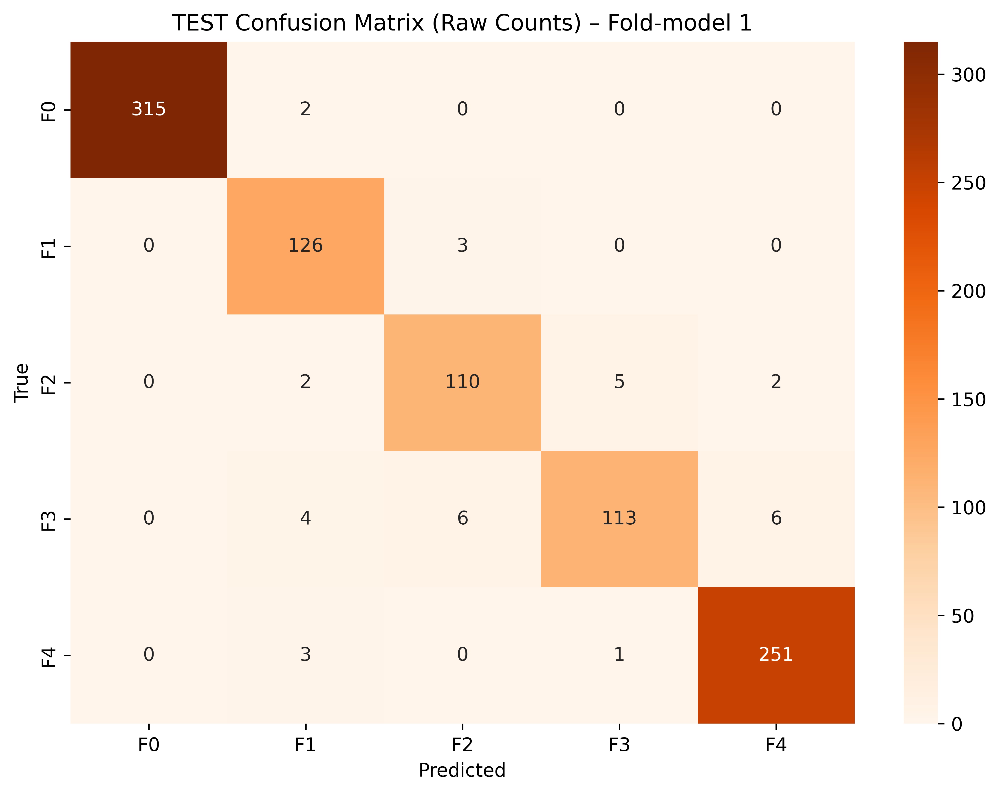

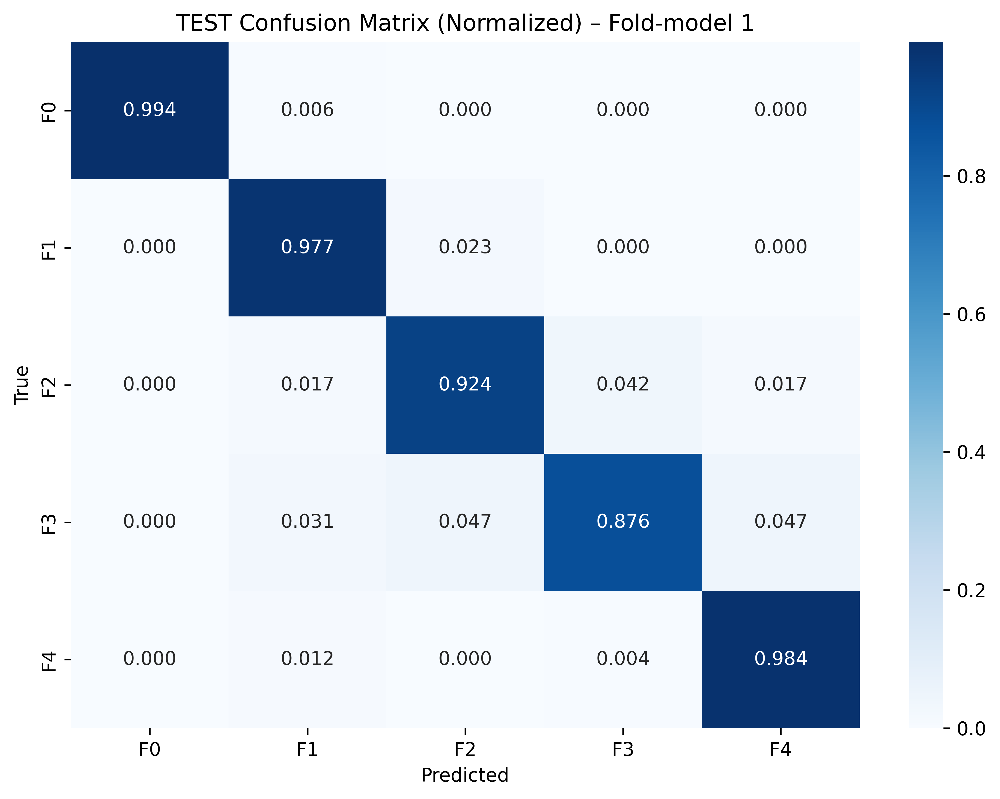


📄 Classification Report (Fold-model 1 on TEST):
              precision    recall  f1-score   support

          F0     1.0000    0.9937    0.9968       317
          F1     0.9197    0.9767    0.9474       129
          F2     0.9244    0.9244    0.9244       119
          F3     0.9496    0.8760    0.9113       129
          F4     0.9691    0.9843    0.9767       255

    accuracy                         0.9642       949
   macro avg     0.9526    0.9510    0.9513       949
weighted avg     0.9644    0.9642    0.9640       949


🔹 Fold-model 2 on TEST set...
Backbone: DenseNet121 | Channels: 1024
✅ Fold 2 TEST Accuracy: 0.9557
✅ Fold 2 TEST QWK:      0.9863


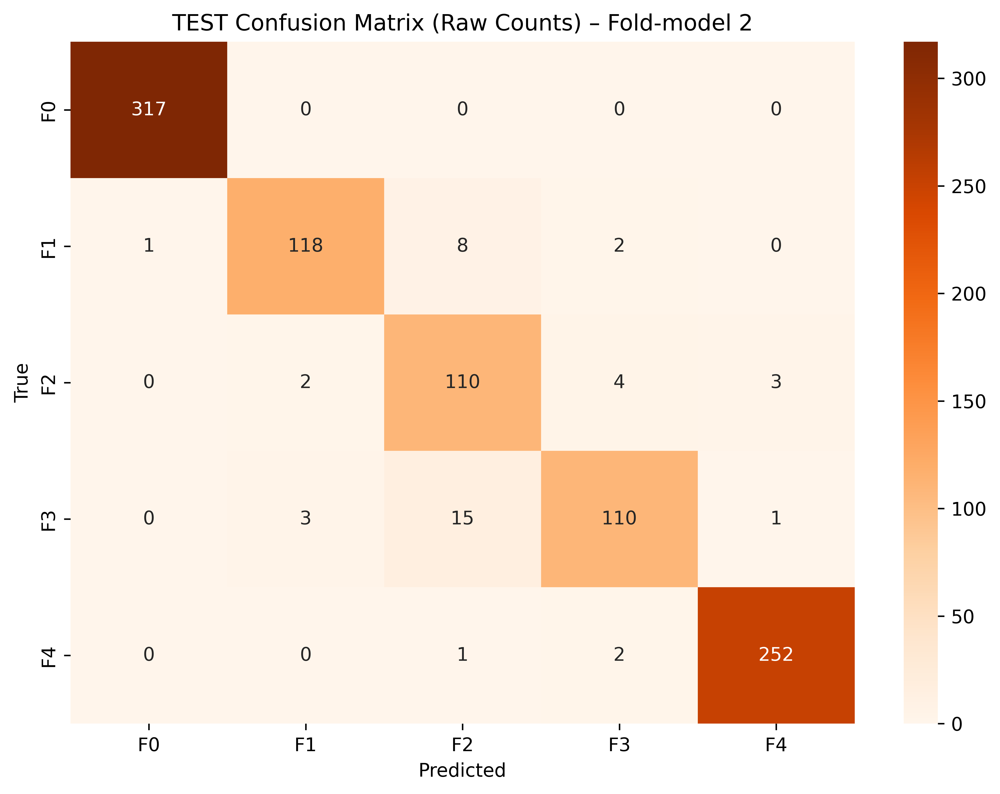

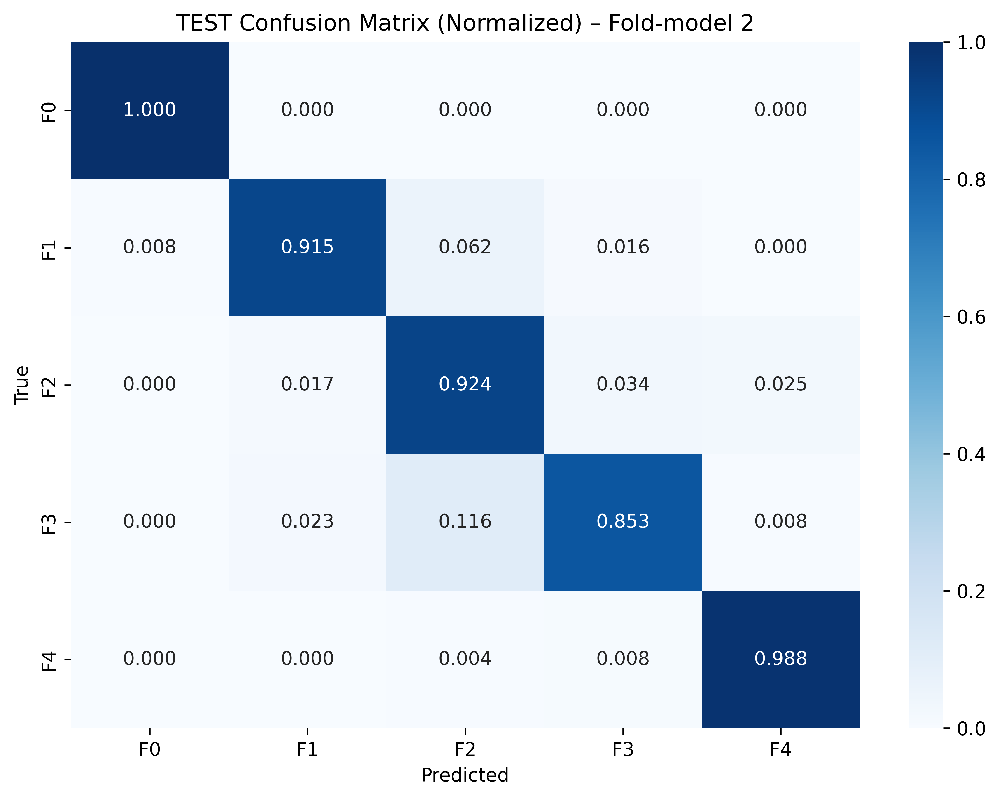


📄 Classification Report (Fold-model 2 on TEST):
              precision    recall  f1-score   support

          F0     0.9969    1.0000    0.9984       317
          F1     0.9593    0.9147    0.9365       129
          F2     0.8209    0.9244    0.8696       119
          F3     0.9322    0.8527    0.8907       129
          F4     0.9844    0.9882    0.9863       255

    accuracy                         0.9557       949
   macro avg     0.9387    0.9360    0.9363       949
weighted avg     0.9576    0.9557    0.9559       949


🔹 Fold-model 3 on TEST set...
Backbone: DenseNet121 | Channels: 1024
✅ Fold 3 TEST Accuracy: 0.9631
✅ Fold 3 TEST QWK:      0.9860


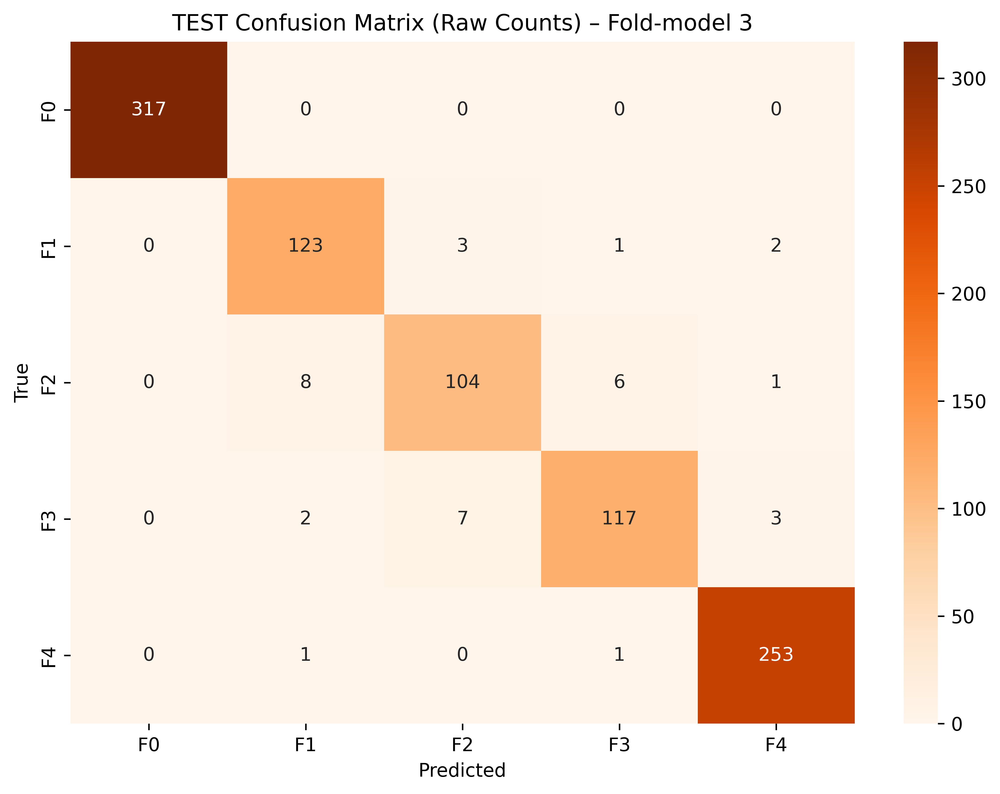

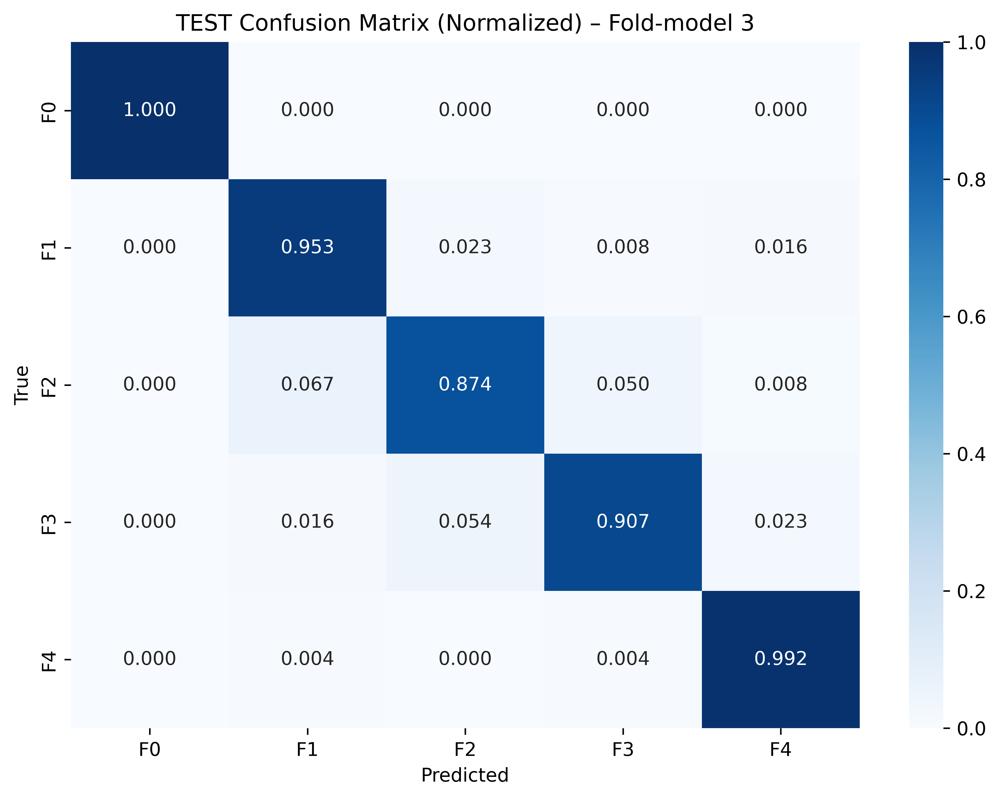


📄 Classification Report (Fold-model 3 on TEST):
              precision    recall  f1-score   support

          F0     1.0000    1.0000    1.0000       317
          F1     0.9179    0.9535    0.9354       129
          F2     0.9123    0.8739    0.8927       119
          F3     0.9360    0.9070    0.9213       129
          F4     0.9768    0.9922    0.9844       255

    accuracy                         0.9631       949
   macro avg     0.9486    0.9453    0.9468       949
weighted avg     0.9629    0.9631    0.9629       949


📊 OVERALL (Aggregated) TEST PERFORMANCE
⚠️ Note: This is NOT an ensemble. Test set is repeated across folds.
✅ Overall Accuracy: 0.9610
✅ Overall QWK:      0.9858


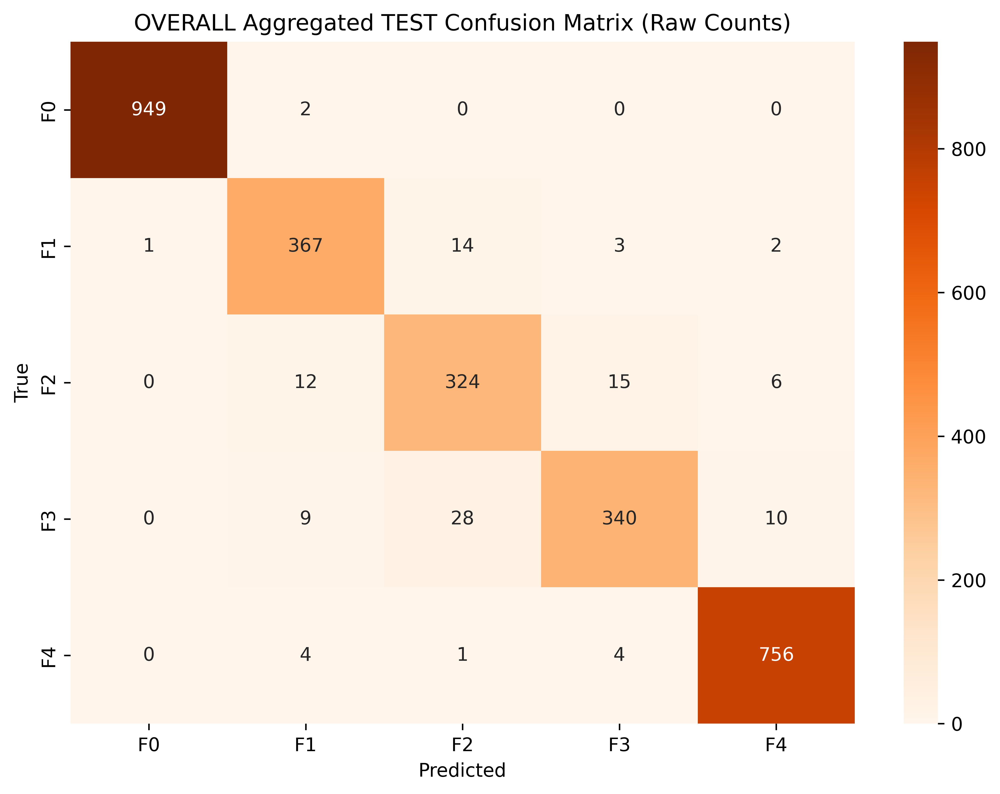

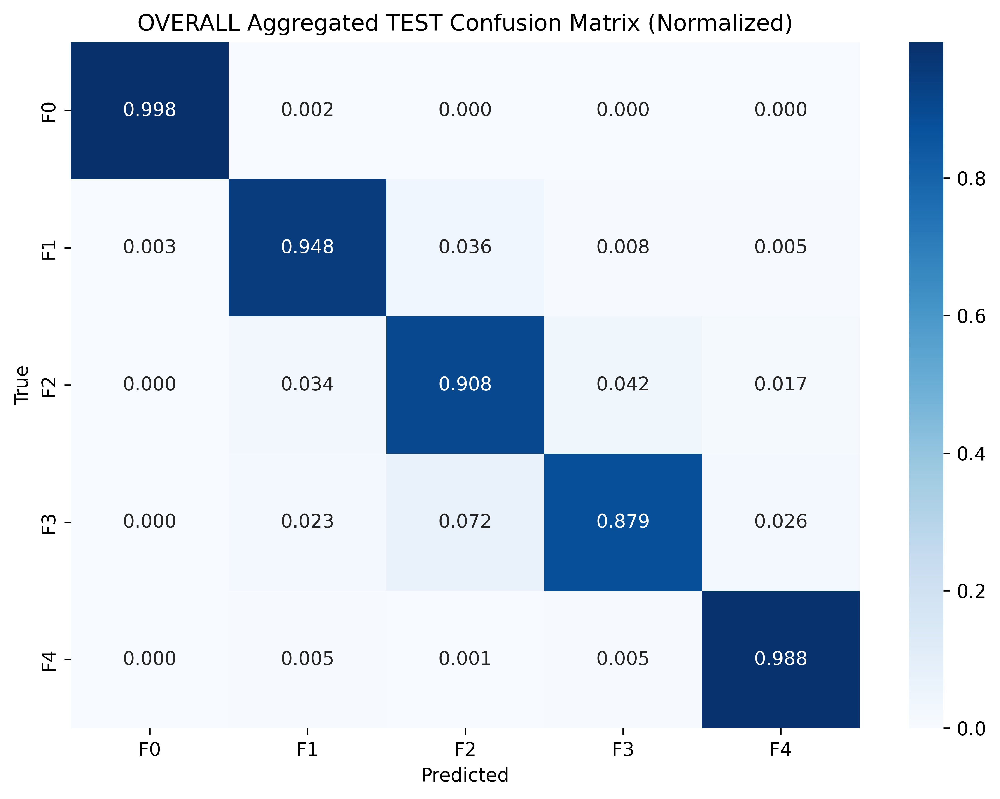


📄 Classification Report (OVERALL aggregated TEST):
              precision    recall  f1-score   support

          F0     0.9989    0.9979    0.9984       951
          F1     0.9315    0.9483    0.9398       387
          F2     0.8828    0.9076    0.8950       357
          F3     0.9392    0.8786    0.9079       387
          F4     0.9767    0.9882    0.9825       765

    accuracy                         0.9610      2847
   macro avg     0.9458    0.9441    0.9447      2847
weighted avg     0.9611    0.9610    0.9609      2847



In [12]:
# ============================
# OPTIONAL: TEST SET RESULTS PER FOLD MODEL + OVERALL
# (Fold-model-on-test; NOT CV validation)
# ============================

import os
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import torch
from torch.utils.data import DataLoader
from sklearn.metrics import (
    confusion_matrix, classification_report,
    accuracy_score, cohen_kappa_score
)

print("📌 Generating PER-FOLD (fold-model-on-test) and OVERALL confusion matrices...")

# ---------- Load model function ----------
def load_gcn_model(path):
    model = DenseNet_GCN(num_classes=CFG.NUM_CLASSES).to(CFG.DEVICE)  # your model class
    model.load_state_dict(torch.load(path, map_location=CFG.DEVICE))
    model.eval()
    return model

# ---------- Model weight files ----------
fold_models = [
    "densenet_gcn_fold1_best.pth",
    "densenet_gcn_fold2_best.pth",
    "densenet_gcn_fold3_best.pth"
]

# Optional: check files exist (prevents crash)
for p in fold_models:
    if not os.path.exists(p):
        print(f"⚠️ Warning: missing weight file -> {p}")

# ---------- TEST loader ----------
test_loader = DataLoader(
    LiverDataset(test_df, transform=valid_tfms),
    batch_size=CFG.BATCH_SIZE,
    shuffle=False,
    num_workers=2
)

# Class names
class_names = list(class_map.keys()) if "class_map" in globals() else ['F0','F1','F2','F3','F4']

all_true, all_pred = [], []

# ============================
# PER-FOLD MODEL → TEST RESULTS
# ============================
for fold, model_path in enumerate(fold_models, start=1):
    if not os.path.exists(model_path):
        print(f"\n⚠️ Skipping Fold-model {fold} because file not found: {model_path}")
        continue

    print(f"\n🔹 Fold-model {fold} on TEST set...")
    model = load_gcn_model(model_path)

    y_true_fold, y_pred_fold = [], []

    with torch.no_grad():
        for imgs, labels in test_loader:
            imgs = imgs.to(CFG.DEVICE)
            outputs = model(imgs)
            preds = outputs.argmax(dim=1).cpu().numpy()

            y_pred_fold.extend(preds)
            y_true_fold.extend(labels.numpy())

    # Metrics
    fold_acc = accuracy_score(y_true_fold, y_pred_fold)
    fold_qwk = cohen_kappa_score(y_true_fold, y_pred_fold, weights="quadratic")

    print(f"✅ Fold {fold} TEST Accuracy: {fold_acc:.4f}")
    print(f"✅ Fold {fold} TEST QWK:      {fold_qwk:.4f}")

    # Save for overall (NOTE: this repeats the test set 3 times, so "overall" is NOT an ensemble)
    all_true.extend(y_true_fold)
    all_pred.extend(y_pred_fold)

    # Confusion matrix
    cm_raw = confusion_matrix(y_true_fold, y_pred_fold)

    # RAW (orange)
    plt.figure(figsize=(8, 6), dpi=600)
    sns.heatmap(cm_raw, annot=True, fmt="d", cmap="Oranges",
                xticklabels=class_names, yticklabels=class_names)
    plt.title(f"TEST Confusion Matrix (Raw Counts) – Fold-model {fold}")
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.tight_layout()
    plt.show()

    # NORMALIZED (blue)
    cm_norm = cm_raw.astype(float) / (cm_raw.sum(axis=1, keepdims=True) + 1e-8)
    plt.figure(figsize=(8, 6), dpi=600)
    sns.heatmap(cm_norm, annot=True, fmt=".3f", cmap="Blues",
                xticklabels=class_names, yticklabels=class_names)
    plt.title(f"TEST Confusion Matrix (Normalized) – Fold-model {fold}")
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.tight_layout()
    plt.show()

    print(f"\n📄 Classification Report (Fold-model {fold} on TEST):")
    print(classification_report(y_true_fold, y_pred_fold, target_names=class_names, digits=4))

# ============================
# "OVERALL" (Aggregated) — NOT ENSEMBLE
# ============================
all_true = np.array(all_true)
all_pred = np.array(all_pred)

if len(all_true) == 0:
    print("\n❌ No predictions collected. Check your weight paths and test_loader.")
else:
    overall_acc = accuracy_score(all_true, all_pred)
    overall_qwk = cohen_kappa_score(all_true, all_pred, weights="quadratic")

    print("\n========================================")
    print("📊 OVERALL (Aggregated) TEST PERFORMANCE")
    print("⚠️ Note: This is NOT an ensemble. Test set is repeated across folds.")
    print(f"✅ Overall Accuracy: {overall_acc:.4f}")
    print(f"✅ Overall QWK:      {overall_qwk:.4f}")
    print("========================================")

    cm_overall = confusion_matrix(all_true, all_pred)

    # RAW overall (orange)
    plt.figure(figsize=(8, 6), dpi=600)
    sns.heatmap(cm_overall, annot=True, fmt="d", cmap="Oranges",
                xticklabels=class_names, yticklabels=class_names)
    plt.title("OVERALL Aggregated TEST Confusion Matrix (Raw Counts)")
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.tight_layout()
    plt.show()

    # NORMALIZED overall (blue)
    cm_overall_norm = cm_overall.astype(float) / (cm_overall.sum(axis=1, keepdims=True) + 1e-8)
    plt.figure(figsize=(8, 6), dpi=600)
    sns.heatmap(cm_overall_norm, annot=True, fmt=".3f", cmap="Blues",
                xticklabels=class_names, yticklabels=class_names)
    plt.title("OVERALL Aggregated TEST Confusion Matrix (Normalized)")
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.tight_layout()
    plt.show()

    print("\n📄 Classification Report (OVERALL aggregated TEST):")
    print(classification_report(all_true, all_pred, target_names=class_names, digits=4))



🚀 Evaluating MAIN TEST SET (Ensemble)...
Backbone: DenseNet121 | Channels: 1024
Backbone: DenseNet121 | Channels: 1024
Backbone: DenseNet121 | Channels: 1024

📊 MAIN TEST SET RESULTS (ENSEMBLE)
✅ Test Accuracy: 0.9895
✅ Test QWK:      0.9974

📄 Classification Report:
              precision    recall  f1-score   support

          F0     1.0000    1.0000    1.0000       317
          F1     0.9923    1.0000    0.9961       129
          F2     0.9658    0.9496    0.9576       119
          F3     0.9690    0.9690    0.9690       129
          F4     0.9961    1.0000    0.9980       255

    accuracy                         0.9895       949
   macro avg     0.9846    0.9837    0.9842       949
weighted avg     0.9894    0.9895    0.9894       949



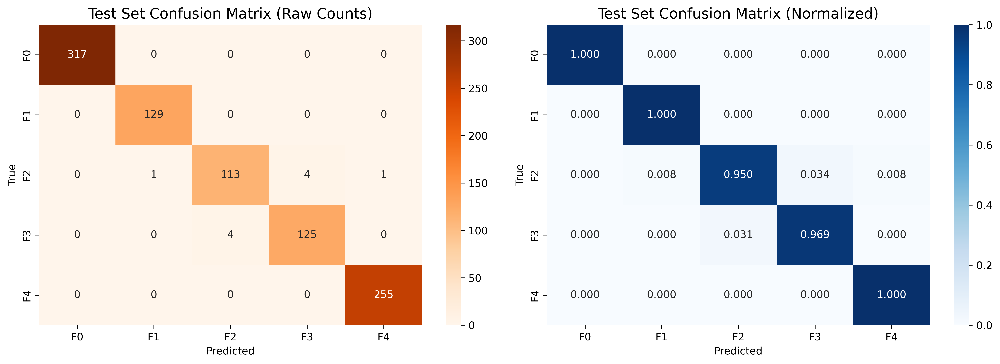

In [15]:
# ============================
# TEST SET EVALUATION (ENSEMBLE) — MAIN RESULT (600 DPI)
# ============================

import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import torch
from sklearn.metrics import accuracy_score, cohen_kappa_score, confusion_matrix, classification_report
from torch.utils.data import DataLoader

print("\n🚀 Evaluating MAIN TEST SET (Ensemble)...")

# -------- Load test data --------
test_loader = DataLoader(
    LiverDataset(test_df, transform=valid_tfms),
    batch_size=CFG.BATCH_SIZE,
    shuffle=False,
    num_workers=2
)

# -------- Load ensemble models --------
fold_models = [
    "densenet_gcn_fold1_best.pth",
    "densenet_gcn_fold2_best.pth",
    "densenet_gcn_fold3_best.pth"
]

models = []
for path in fold_models:
    model = DenseNet_GCN(num_classes=CFG.NUM_CLASSES).to(CFG.DEVICE)
    model.load_state_dict(torch.load(path, map_location=CFG.DEVICE))
    model.eval()
    models.append(model)

# -------- Inference --------
all_labels, all_preds = [], []

with torch.no_grad():
    for imgs, labels in test_loader:
        imgs = imgs.to(CFG.DEVICE)

        probs = torch.zeros((imgs.size(0), CFG.NUM_CLASSES)).to(CFG.DEVICE)
        for m in models:
            probs += torch.softmax(m(imgs), dim=1)
        probs /= len(models)

        preds = torch.argmax(probs, dim=1)

        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(labels.numpy())

all_labels = np.array(all_labels)
all_preds  = np.array(all_preds)

# -------- Metrics --------
acc = accuracy_score(all_labels, all_preds)
qwk = cohen_kappa_score(all_labels, all_preds, weights="quadratic")

print("\n========================================")
print("📊 MAIN TEST SET RESULTS (ENSEMBLE)")
print(f"✅ Test Accuracy: {acc:.4f}")
print(f"✅ Test QWK:      {qwk:.4f}")
print("========================================")

print("\n📄 Classification Report:")
print(classification_report(
    all_labels,
    all_preds,
    target_names=list(class_map.keys()),
    digits=4
))

# ============================
# CONFUSION MATRICES (TEST SET) — 600 DPI
# ============================

cm = confusion_matrix(all_labels, all_preds)

fig, ax = plt.subplots(
    1, 2,
    figsize=(14, 5),
    dpi=600              # 🔴 HIGH RESOLUTION
)

# ---- RAW CONFUSION MATRIX (ORANGE) ----
sns.heatmap(
    cm,
    annot=True,
    fmt="d",
    cmap="Oranges",
    xticklabels=class_map.keys(),
    yticklabels=class_map.keys(),
    ax=ax[0]
)
ax[0].set_title("Test Set Confusion Matrix (Raw Counts)", fontsize=14)
ax[0].set_xlabel("Predicted")
ax[0].set_ylabel("True")

# ---- NORMALIZED CONFUSION MATRIX (BLUE) ----
cm_norm = cm.astype(float) / (cm.sum(axis=1, keepdims=True) + 1e-8)
sns.heatmap(
    cm_norm,
    annot=True,
    fmt=".3f",
    cmap="Blues",
    xticklabels=class_map.keys(),
    yticklabels=class_map.keys(),
    ax=ax[1]
)
ax[1].set_title("Test Set Confusion Matrix (Normalized)", fontsize=14)
ax[1].set_xlabel("Predicted")
ax[1].set_ylabel("True")

plt.tight_layout()
plt.show()
# -------- Inference --------
all_labels, all_preds, all_probs = [], [], []

with torch.no_grad():
    for imgs, labels in test_loader:
        imgs = imgs.to(CFG.DEVICE)

        probs = torch.zeros((imgs.size(0), CFG.NUM_CLASSES)).to(CFG.DEVICE)
        for m in models:
            probs += torch.softmax(m(imgs), dim=1)
        probs /= len(models)

        preds = torch.argmax(probs, dim=1)

        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(labels.numpy())
        all_probs.extend(probs.cpu().numpy())   # 🔴 THIS LINE FIXES EVERYTHING

# Convert to numpy
all_labels = np.array(all_labels)
all_preds  = np.array(all_preds)
all_probs  = np.array(all_probs)

# OPTIONAL: SAVE FIGURE FOR PAPER
fig.savefig(
    "test_confusion_matrix_ensemble.png",
    dpi=600,
    bbox_inches="tight"
)


🚀 Generating ROC/AUC Curves...

📊 ROC/AUC RESULTS (TEST SET)
✅ Micro-average AUC: 0.9996
✅ Macro-average AUC: 0.9993
   - Class F0 AUC: 1.0000
   - Class F1 AUC: 1.0000
   - Class F2 AUC: 0.9975
   - Class F3 AUC: 0.9990
   - Class F4 AUC: 1.0000


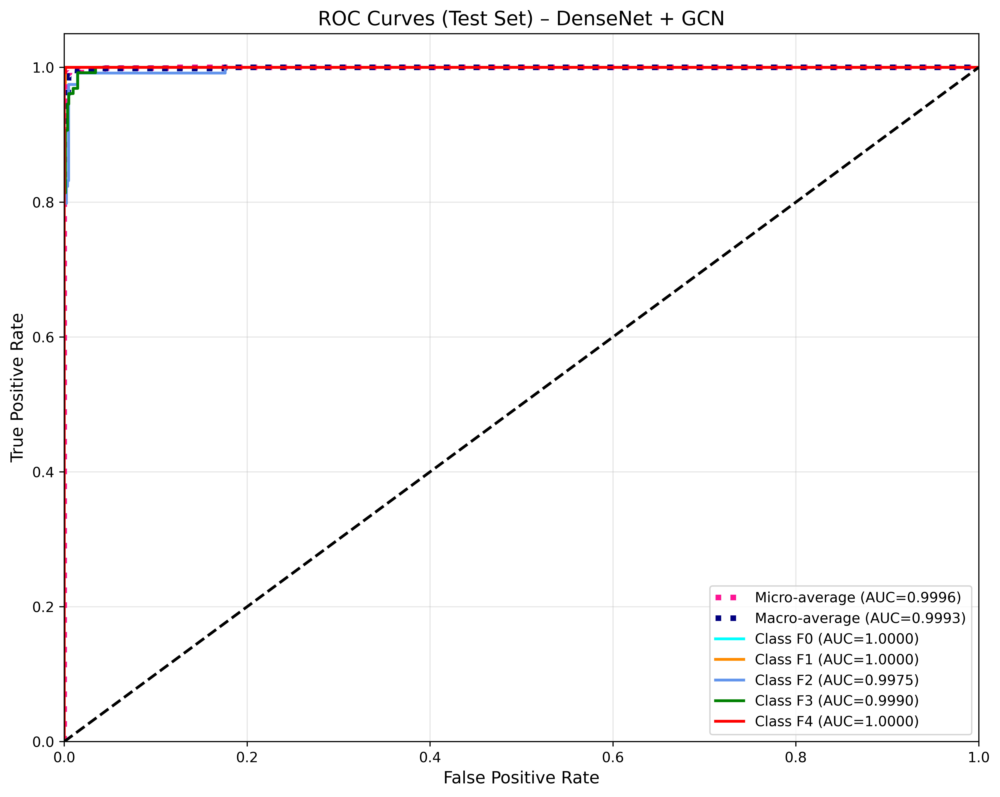

In [16]:
# --- CELL 11: ROC/AUC CURVES (DenseNet + GCN) — 600 DPI ---
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize
from itertools import cycle
import numpy as np
import matplotlib.pyplot as plt

print("🚀 Generating ROC/AUC Curves...")

# Safety check
if 'all_probs' not in locals() or 'all_labels' not in locals():
    print("❌ Error: Predictions not found. Please run TEST evaluation cell first!")
else:
    # 1. Binarize labels
    y_test = label_binarize(all_labels, classes=range(CFG.NUM_CLASSES))
    y_score = all_probs
    n_classes = y_test.shape[1]

    # 2. Compute ROC/AUC per class
    fpr, tpr, roc_auc = dict(), dict(), dict()
    for i in range(n_classes):
        fpr[i], tpr[i], _ = roc_curve(y_test[:, i], y_score[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])

    # 3. Micro-average ROC/AUC
    fpr["micro"], tpr["micro"], _ = roc_curve(y_test.ravel(), y_score.ravel())
    roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

    # 4. Macro-average ROC/AUC
    all_fpr = np.unique(np.concatenate([fpr[i] for i in range(n_classes)]))
    mean_tpr = np.zeros_like(all_fpr)
    for i in range(n_classes):
        mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])
    mean_tpr /= n_classes

    fpr["macro"] = all_fpr
    tpr["macro"] = mean_tpr
    roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

    # 5. Print AUC values
    print(f"\n{'='*40}")
    print("📊 ROC/AUC RESULTS (TEST SET)")
    print(f"✅ Micro-average AUC: {roc_auc['micro']:.4f}")
    print(f"✅ Macro-average AUC: {roc_auc['macro']:.4f}")
    for i in range(n_classes):
        print(f"   - Class F{i} AUC: {roc_auc[i]:.4f}")
    print(f"{'='*40}")

    # 6. Plot ROC curves (600 DPI)
    fig = plt.figure(figsize=(10, 8), dpi=600)

    # Micro & Macro
    plt.plot(
        fpr["micro"], tpr["micro"],
        label=f'Micro-average (AUC={roc_auc["micro"]:.4f})',
        color='deeppink', linestyle=':', lw=4
    )

    plt.plot(
        fpr["macro"], tpr["macro"],
        label=f'Macro-average (AUC={roc_auc["macro"]:.4f})',
        color='navy', linestyle=':', lw=4
    )

    # Per-class ROC
    colors = cycle(['aqua', 'darkorange', 'cornflowerblue', 'green', 'red'])
    for i, color in zip(range(n_classes), colors):
        plt.plot(
            fpr[i], tpr[i], color=color, lw=2,
            label=f'Class F{i} (AUC={roc_auc[i]:.4f})'
        )

    # Diagonal
    plt.plot([0, 1], [0, 1], 'k--', lw=2)

    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate', fontsize=12)
    plt.ylabel('True Positive Rate', fontsize=12)
    plt.title('ROC Curves (Test Set) – DenseNet + GCN', fontsize=14)
    plt.legend(loc="lower right", fontsize=10)
    plt.grid(alpha=0.3)

    plt.tight_layout()
    plt.show()

    # OPTIONAL: save for paper
    fig.savefig(
        "roc_auc_densenet_gcn_test.png",
        dpi=600,
        bbox_inches="tight"
    )


Backbone: DenseNet121 | Channels: 1024
✅ Loaded Fold 1
Backbone: DenseNet121 | Channels: 1024
✅ Loaded Fold 2
Backbone: DenseNet121 | Channels: 1024
✅ Loaded Fold 3

🔍 Testing on 4 random images...


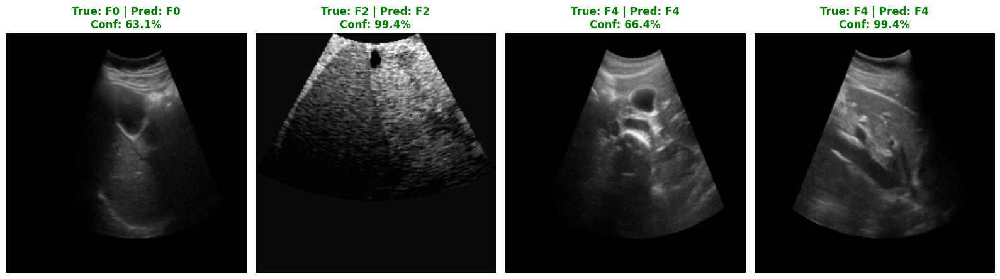

In [18]:
# --- CELL 12: ENSEMBLE INTERFACE TEST (DenseNet + GCN) ---
import gc

class EnsembleGCN(nn.Module):
    def __init__(self):
        super().__init__()
        self.models = nn.ModuleList()
        torch.cuda.empty_cache(); gc.collect()
        
        for i in range(3):
            p = f"densenet_gcn_fold{i+1}_best.pth"
            if os.path.exists(p):
                m = DenseNet_GCN(CFG.NUM_CLASSES)
                m.load_state_dict(torch.load(p, map_location=CFG.DEVICE))
                m.to(CFG.DEVICE).eval()
                self.models.append(m)
                print(f"✅ Loaded Fold {i+1}")

    def forward(self, x):
        probs = [F.softmax(m(x), 1) for m in self.models]
        return torch.mean(torch.stack(probs), 0)

ensemble_gcn = EnsembleGCN()

def predict_interface(df_data, n=4):
    print(f"\n🔍 Testing on {n} random images...")
    samples = df_data.sample(n)
    fig, axes = plt.subplots(1, n, figsize=(4*n, 5))
    if n==1: axes=[axes]
    
    for i, (_, row) in enumerate(samples.iterrows()):
        img = cv2.imread(row.image_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        rsz = cv2.resize(img, (CFG.IMG_SIZE, CFG.IMG_SIZE))
        
        t = valid_tfms(image=rsz)["image"].unsqueeze(0).to(CFG.DEVICE)
        with torch.no_grad(): p = ensemble_gcn(t)[0].cpu().numpy()
        
        pred = np.argmax(p)
        conf = p[pred]*100
        true = int(row.diagnosis)
        col = 'green' if pred == true else 'red'
        
        axes[i].imshow(rsz)
        axes[i].set_title(f"True: F{true} | Pred: F{pred}\nConf: {conf:.1f}%", color=col, fontweight='bold')
        axes[i].axis('off')
    plt.tight_layout(); plt.show()

# Run
predict_interface(trainval_df, n=4)

🚀 Generating 6-Panel XAI for DenseNet121 + GCN...
Backbone: DenseNet121 | Channels: 1024

--- Class F0 ---


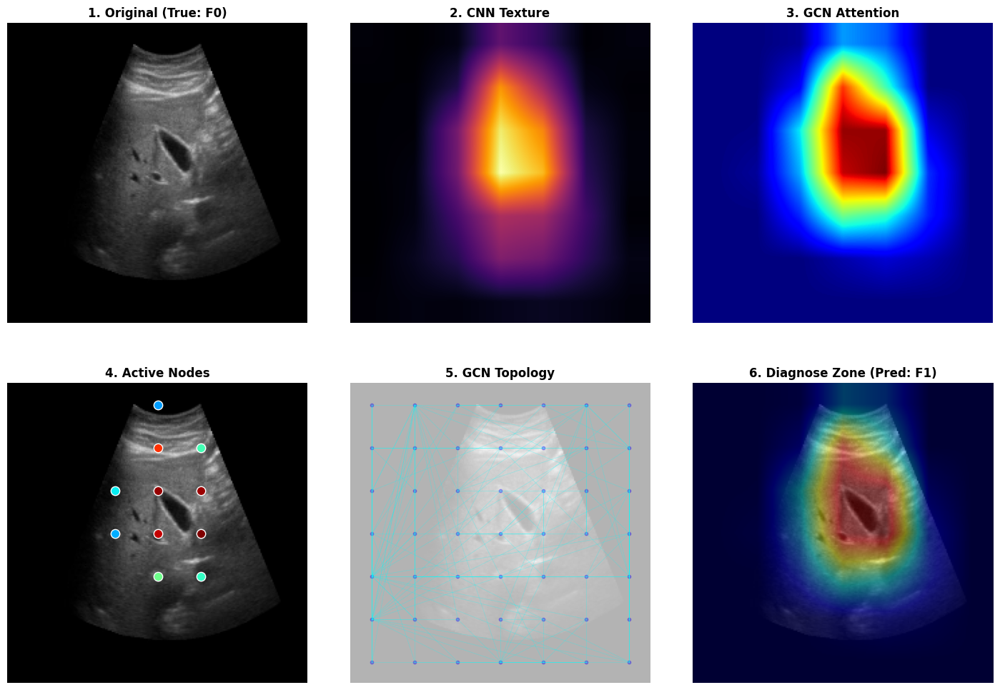


--- Class F1 ---


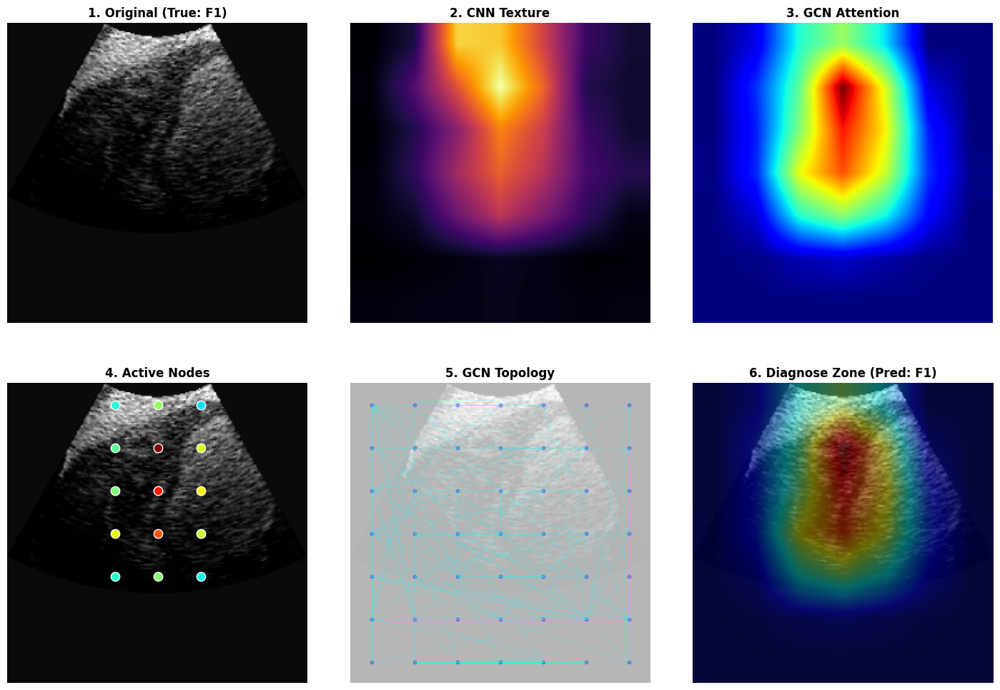


--- Class F2 ---


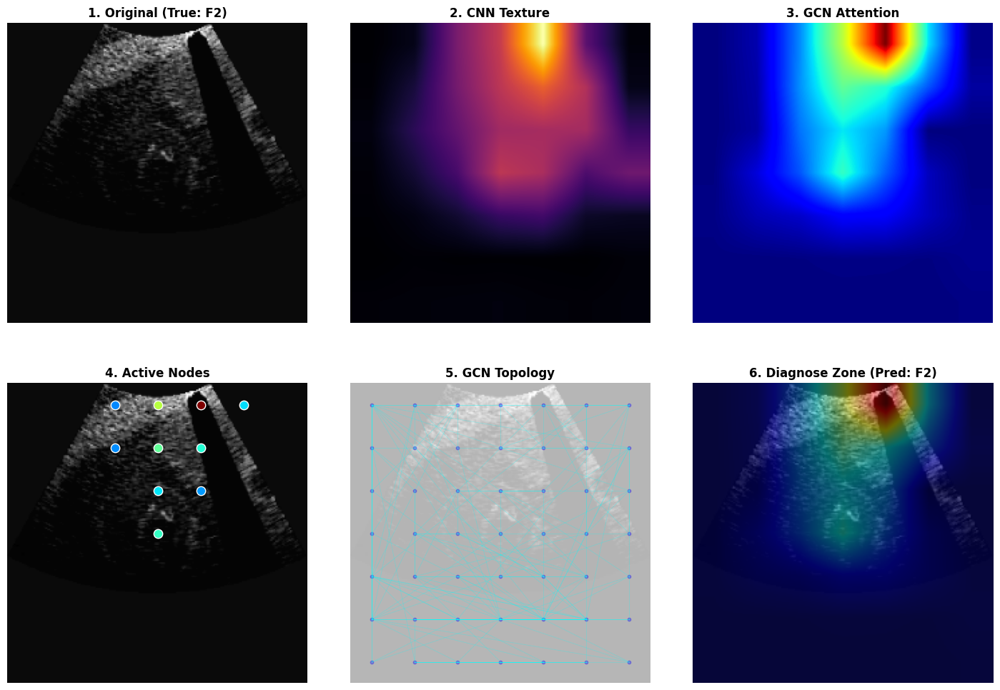


--- Class F3 ---


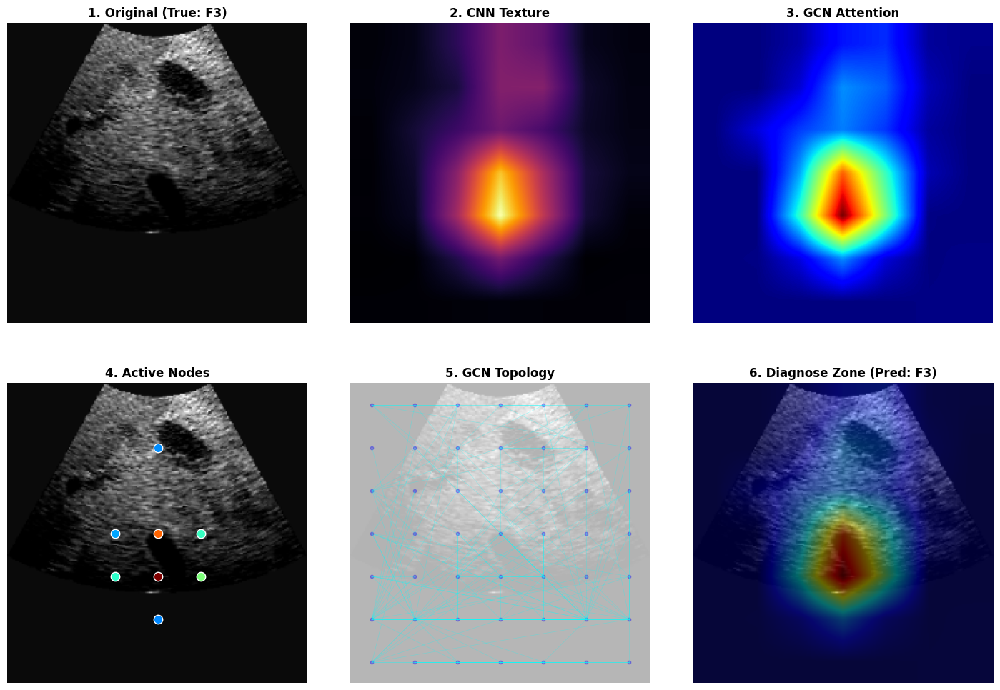


--- Class F4 ---


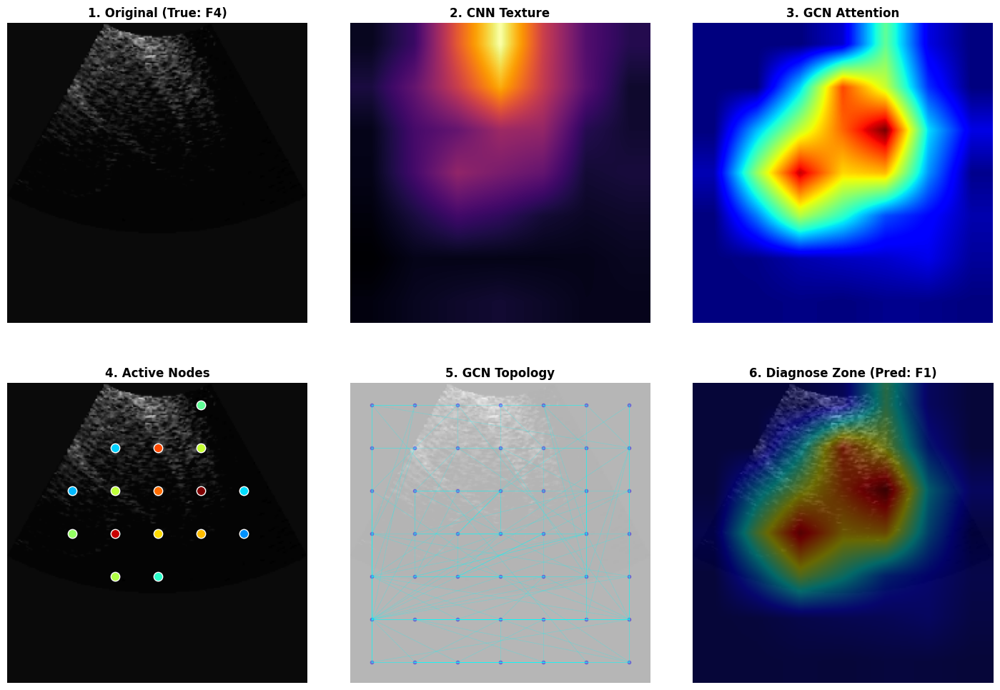

In [30]:
# --- CELL 13: 6-PANEL XAI VISUALIZATION (DenseNet + GCN) ---
print("🚀 Generating 6-Panel XAI for DenseNet121 + GCN...")

# 1. Extraction Function
def extract_gcn_xai(model, img_tensor, target_class=None):
    model.eval()
    model.zero_grad()
    
    # Hooks
    fmaps, grads = [], []
    def hook(module, input, output):
        f = output[-1] if isinstance(output, (list, tuple)) else output
        fmaps.append(f); f.register_hook(lambda g: grads.append(g))

    h = model.backbone.register_forward_hook(hook)
    
    # Forward/Backward
    with torch.set_grad_enabled(True):
        logits = model(img_tensor)
        pred = logits.argmax(1).item()
        tgt = pred if target_class is None else target_class
        logits[0, tgt].backward()
    h.remove()
    
    # 1. Texture
    fmap = fmaps[0].detach()
    tex = torch.mean(fmap, dim=1).squeeze().cpu().numpy()
    tex = (tex - tex.min()) / (tex.max() - tex.min() + 1e-8)
    
    # 2. Attention
    grad = grads[0].detach()
    w = torch.mean(grad, dim=(2,3), keepdim=True)
    cam = torch.sum(w * fmap, dim=1).squeeze()
    cam = F.relu(cam).cpu().numpy()
    cam = (cam - cam.min()) / (cam.max() - cam.min() + 1e-8)
    
    # 3. Graph Topology
    with torch.no_grad():
        C, H, W = fmap.shape[1:]
        flat = fmap[0].view(C, -1).permute(1,0)
        dist = torch.cdist(flat, flat)
        _, idx = dist.topk(k=model.k, largest=False)
        src = torch.arange(H*W, device=fmap.device).view(-1,1).repeat(1, model.k).reshape(-1)
        dst = idx.reshape(-1)
        mask = src != dst
        edges = list(zip(src[mask].cpu().numpy(), dst[mask].cpu().numpy()))
        
        nodes = []
        for i in range(H*W):
            r, c = divmod(i, W)
            y = int((r+0.5)*(CFG.IMG_SIZE/H))
            x = int((c+0.5)*(CFG.IMG_SIZE/W))
            nodes.append((x, y))
            
    return tex, cam, nodes, edges, pred

# 2. Plotting Function
def plot_gcn_6_panel(img, tex, cam, nodes, edges, true_y, pred_y):
    fig, ax = plt.subplots(2, 3, figsize=(18, 12), dpi=100)
    plt.subplots_adjust(wspace=0.1, hspace=0.2)
    
    # Helpers
    sz = (CFG.IMG_SIZE, CFG.IMG_SIZE)
    tex_rs = cv2.resize(tex, sz)
    cam_rs = cv2.resize(cam, sz)
    cam_c = cv2.applyColorMap(np.uint8(255*cam_rs), cv2.COLORMAP_JET)
    cam_c = cv2.cvtColor(cam_c, cv2.COLOR_BGR2RGB)
    overlay = cv2.addWeighted(img, 0.6, cam_c, 0.4, 0)
    
    font = {'weight': 'bold', 'size': 12}
    
    # Panels
    ax[0,0].imshow(img); ax[0,0].set_title(f"1. Original (True: F{true_y})", font)
    ax[0,1].imshow(tex_rs, cmap='inferno'); ax[0,1].set_title("2. CNN Texture", font)
    ax[0,2].imshow(cam_rs, cmap='jet'); ax[0,2].set_title("3. GCN Attention", font)
    
    # Active Nodes
    ax[1,0].imshow(img)
    flat = cam.flatten()
    for i, (nx, ny) in enumerate(nodes):
        if flat[i] > 0.25:
            ax[1,0].scatter(nx, ny, c=[plt.cm.jet(flat[i])], s=80, edgecolors='w', zorder=2)
    ax[1,0].set_title("4. Active Nodes", font)
    
    # Topology
    ax[1,1].imshow(img, alpha=0.3)
    c=0
    for s, d in edges:
        if c%2==0: # downsample
            x1,y1=nodes[s]; x2,y2=nodes[d]
            ax[1,1].plot([x1,x2],[y1,y2], c='cyan', alpha=0.3, lw=0.5)
        c+=1
    for nx,ny in nodes: ax[1,1].scatter(nx, ny, c='blue', s=10, alpha=0.3)
    ax[1,1].set_title("5. GCN Topology", font)
    
    # Diagnose
    ax[1,2].imshow(overlay); ax[1,2].set_title(f"6. Diagnose Zone (Pred: F{pred_y})", font)
    
    for a in ax.flatten(): a.axis('off')
    plt.show()

# 3. Run Loop
model = DenseNet_GCN(CFG.NUM_CLASSES).to(CFG.DEVICE)
model.load_state_dict(torch.load("densenet_gcn_fold1_best.pth", map_location=CFG.DEVICE))

for c in range(CFG.NUM_CLASSES):
    sub = trainval_df[trainval_df.diagnosis == c]
    if len(sub) > 0:
        print(f"\n--- Class F{c} ---")
        row = sub.sample(1).iloc[0]
        img = cv2.cvtColor(cv2.imread(row.image_path), cv2.COLOR_BGR2RGB)
        img = cv2.resize(img, (CFG.IMG_SIZE, CFG.IMG_SIZE))
        
        t = valid_tfms(image=img)["image"].unsqueeze(0).to(CFG.DEVICE)
        tex, cam, nodes, edges, pred = extract_gcn_xai(model, t)
        plot_gcn_6_panel(img, tex, cam, nodes, edges, c, pred)

🚀 Generating 6-Panel XAI for DenseNet121 + GCN...
Backbone: DenseNet121 | Channels: 1024

--- Class F0 ---


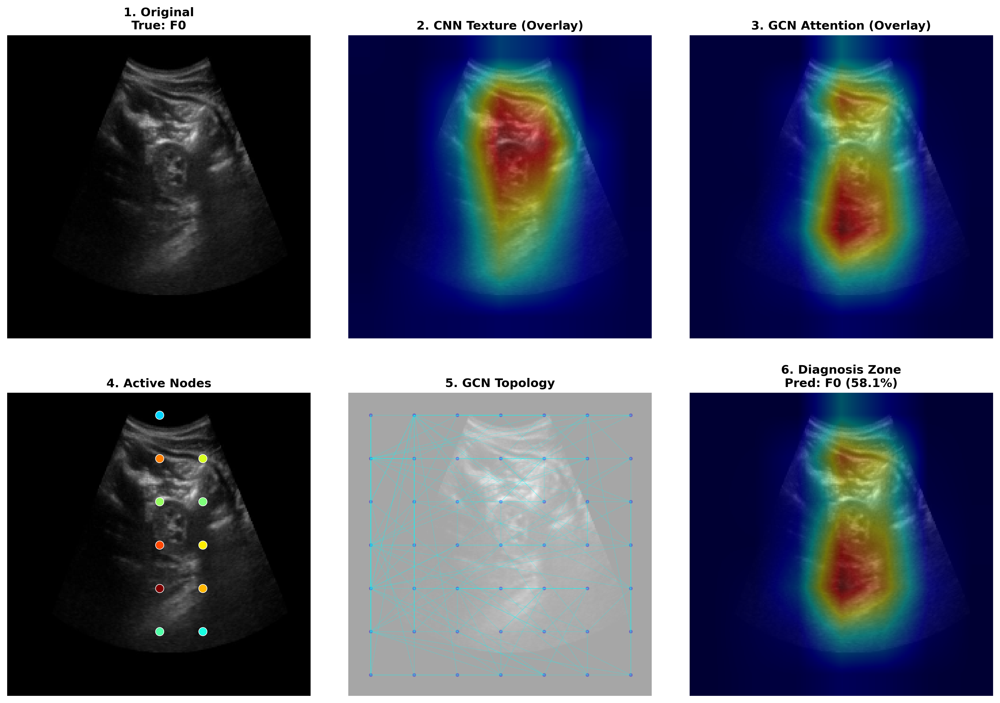


--- Class F1 ---


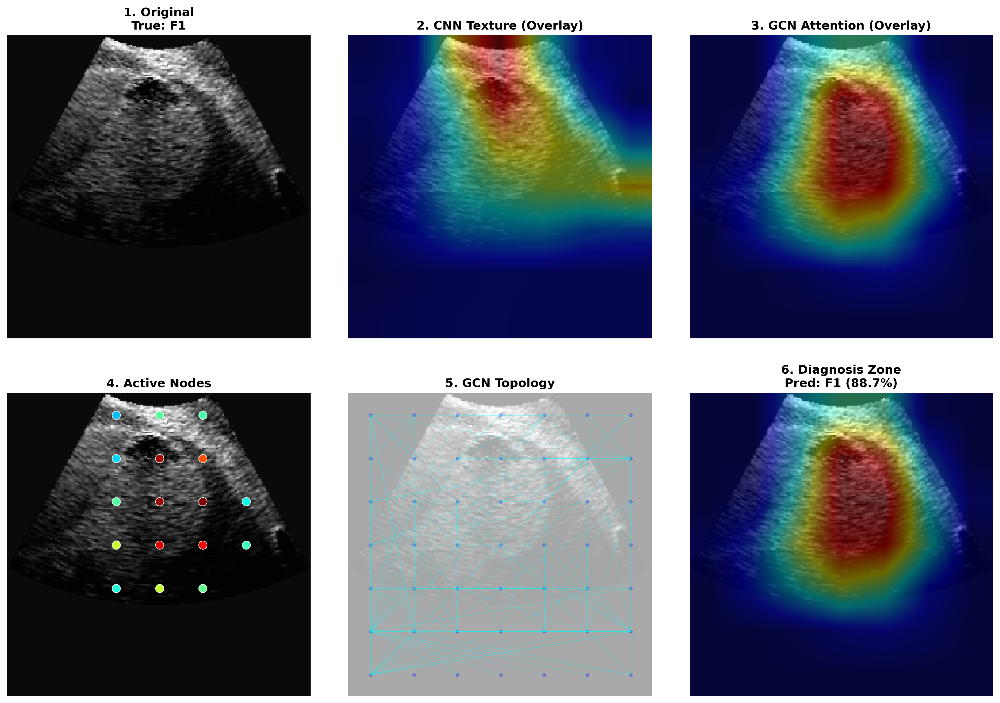


--- Class F2 ---


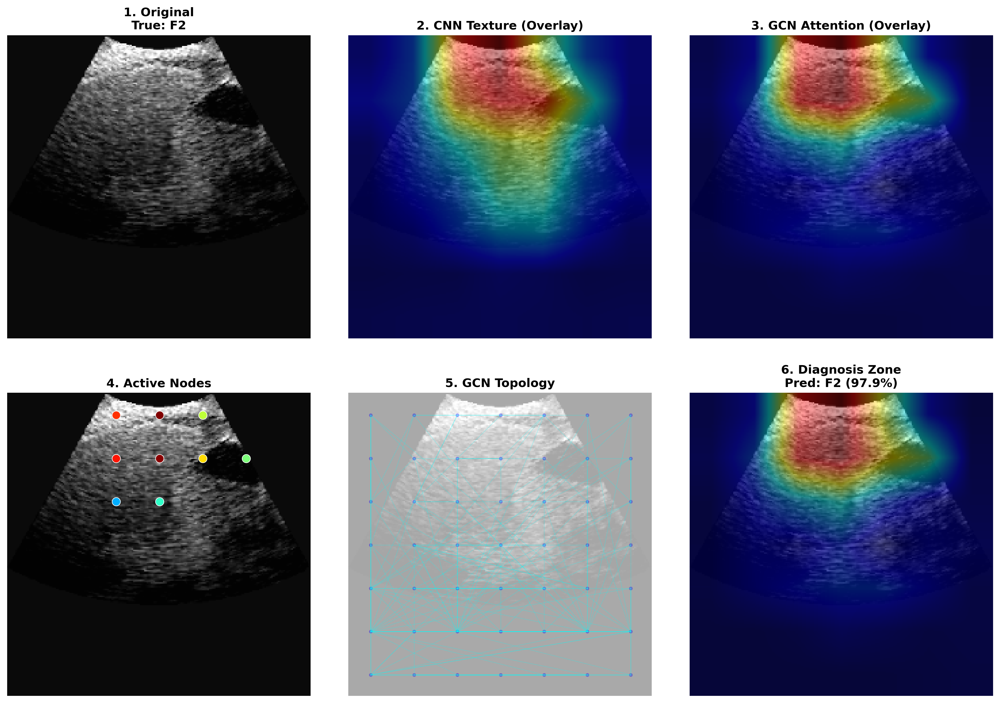


--- Class F3 ---


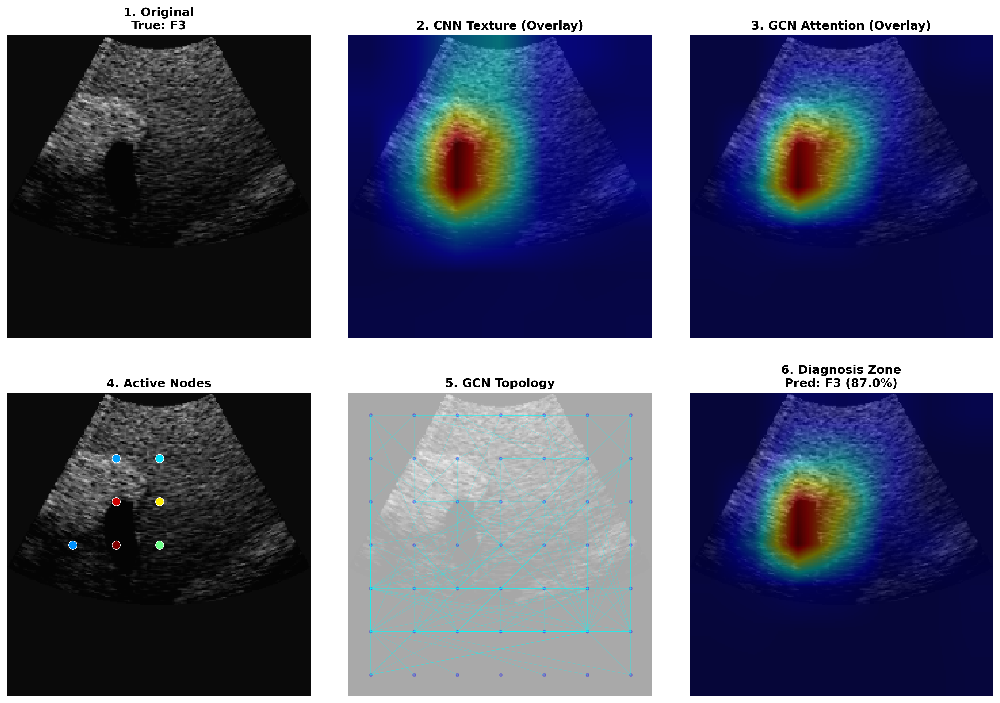


--- Class F4 ---


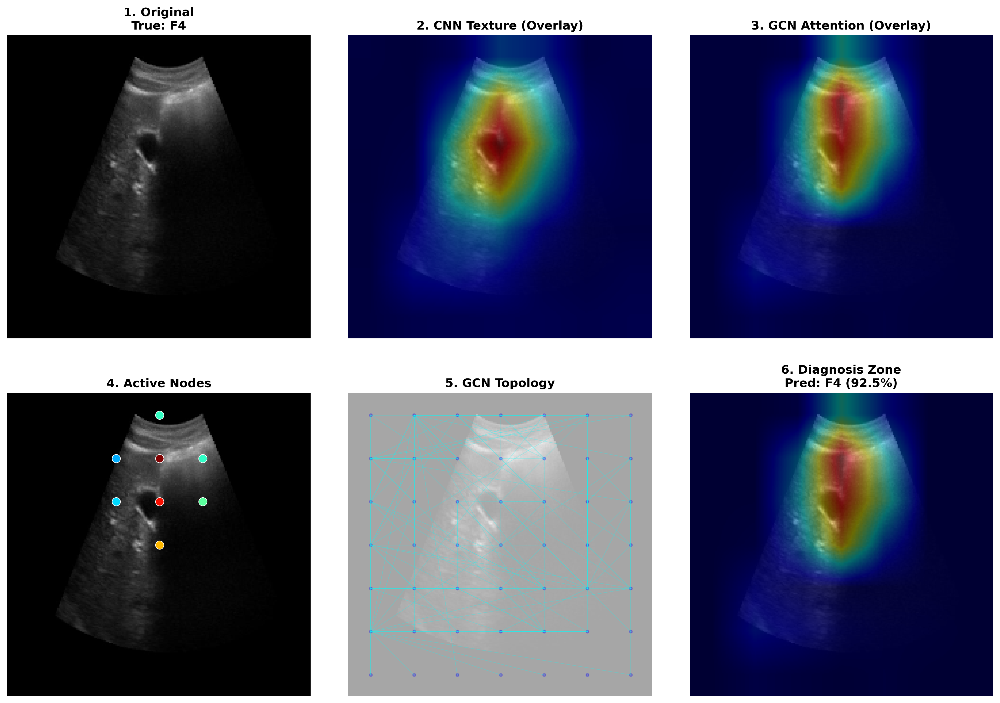

In [38]:
# --- CELL 13: 6-PANEL XAI VISUALIZATION (DenseNet + GCN) ---
print("🚀 Generating 6-Panel XAI for DenseNet121 + GCN...")

import cv2
import torch
import torch.nn.functional as F
import numpy as np
import matplotlib.pyplot as plt

# --------------------------------------------------
# 1) XAI EXTRACTION FUNCTION
# --------------------------------------------------
def extract_gcn_xai(model, img_tensor, true_label=None):
    model.eval()
    model.zero_grad()

    fmaps, grads = [], []

    def hook(module, input, output):
        fmap = output[-1] if isinstance(output, (list, tuple)) else output
        fmaps.append(fmap)
        fmap.register_hook(lambda g: grads.append(g))

    h = model.backbone.register_forward_hook(hook)

    with torch.set_grad_enabled(True):
        logits = model(img_tensor)
        probs  = torch.softmax(logits, dim=1)
        pred   = logits.argmax(1).item()
        conf   = probs[0, pred].item()

        target = pred if true_label is None else true_label
        logits[0, target].backward()

    h.remove()

    # -------- Texture map (simple feature energy) --------
    fmap = fmaps[0].detach()  # [B, C, H, W]
    tex = torch.mean(fmap, dim=1).squeeze().cpu().numpy()
    tex = (tex - tex.min()) / (tex.max() - tex.min() + 1e-8)

    # -------- Attention map (Grad-CAM style) --------
    grad = grads[0].detach()
    w = torch.mean(grad, dim=(2, 3), keepdim=True)
    cam = torch.sum(w * fmap, dim=1).squeeze()
    cam = F.relu(cam).cpu().numpy()
    cam = (cam - cam.min()) / (cam.max() - cam.min() + 1e-8)

    # -------- Graph topology (nodes + edges) --------
    with torch.no_grad():
        C, H, W = fmap.shape[1:]
        flat = fmap[0].view(C, -1).permute(1, 0)  # [H*W, C]
        dist = torch.cdist(flat, flat)
        _, idx = dist.topk(k=model.k, largest=False)

        src = torch.arange(H * W, device=fmap.device).view(-1, 1).repeat(1, model.k).reshape(-1)
        dst = idx.reshape(-1)
        mask = src != dst
        edges = list(zip(src[mask].cpu().numpy(), dst[mask].cpu().numpy()))

        nodes = []
        for i in range(H * W):
            r, c = divmod(i, W)
            y = int((r + 0.5) * (CFG.IMG_SIZE / H))
            x = int((c + 0.5) * (CFG.IMG_SIZE / W))
            nodes.append((x, y))

    return tex, cam, nodes, edges, pred, conf


# --------------------------------------------------
# 2) HELPER: OVERLAY HEATMAP ON IMAGE
# --------------------------------------------------
def overlay_heatmap_on_image(img_rgb, heatmap_01, alpha=0.4, colormap=cv2.COLORMAP_JET):
    """
    img_rgb: (H,W,3) uint8 RGB
    heatmap_01: (H,W) float in [0,1]
    returns: overlay RGB uint8
    """
    heat = np.uint8(255 * heatmap_01)
    heat_color = cv2.applyColorMap(heat, colormap)         # BGR
    heat_color = cv2.cvtColor(heat_color, cv2.COLOR_BGR2RGB)
    overlay = cv2.addWeighted(img_rgb, 1 - alpha, heat_color, alpha, 0)
    return overlay


# --------------------------------------------------
# 3) PLOTTING FUNCTION (TRUE + PRED LABELS)
# --------------------------------------------------
def plot_gcn_6_panel(img, tex, cam, nodes, edges, true_y, pred_y, conf, dpi=300):
    fig, ax = plt.subplots(2, 3, figsize=(18, 12), dpi=dpi)
    plt.subplots_adjust(wspace=0.08, hspace=0.18)

    sz = (CFG.IMG_SIZE, CFG.IMG_SIZE)
    tex_rs = cv2.resize(tex, sz)
    cam_rs = cv2.resize(cam, sz)

    # Overlays to show US image under maps
    tex_overlay = overlay_heatmap_on_image(img, tex_rs, alpha=0.45, colormap=cv2.COLORMAP_JET)
    cam_overlay = overlay_heatmap_on_image(img, cam_rs, alpha=0.45, colormap=cv2.COLORMAP_JET)
    diag_overlay = overlay_heatmap_on_image(img, cam_rs, alpha=0.40, colormap=cv2.COLORMAP_JET)

    font = {'weight': 'bold', 'size': 12}

    # 1. Original
    ax[0, 0].imshow(img)
    ax[0, 0].set_title(f"1. Original\nTrue: F{true_y}", font)

    # 2. Texture OVERLAY on US image
    ax[0, 1].imshow(tex_overlay)
    ax[0, 1].set_title("2. CNN Texture (Overlay)", font)

    # 3. Attention OVERLAY on US image
    ax[0, 2].imshow(cam_overlay)
    ax[0, 2].set_title("3. GCN Attention (Overlay)", font)

    # 4. Active Nodes
    ax[1, 0].imshow(img)
    flat = cam.flatten()
    for i, (nx, ny) in enumerate(nodes):
        if i < len(flat) and flat[i] > 0.25:
            ax[1, 0].scatter(nx, ny, c=[plt.cm.jet(flat[i])], s=70, edgecolors='w', linewidths=0.6, zorder=2)
    ax[1, 0].set_title("4. Active Nodes", font)

    # 5. GCN Topology
    ax[1, 1].imshow(img, alpha=0.35)
    for i, (s, d) in enumerate(edges):
        if i % 2 == 0:  # downsample edges
            x1, y1 = nodes[s]
            x2, y2 = nodes[d]
            ax[1, 1].plot([x1, x2], [y1, y2], c='cyan', alpha=0.25, lw=0.6)
    for nx, ny in nodes:
        ax[1, 1].scatter(nx, ny, c='blue', s=8, alpha=0.25)
    ax[1, 1].set_title("5. GCN Topology", font)

    # 6. Diagnosis overlay + Pred
    ax[1, 2].imshow(diag_overlay)
    ax[1, 2].set_title(f"6. Diagnosis Zone\nPred: F{pred_y} ({conf*100:.1f}%)", font)

    for a in ax.flatten():
        a.axis('off')

    plt.show()


# --------------------------------------------------
# 4) RUN XAI EXAMPLES (TRUE + PRED)
# --------------------------------------------------
model = DenseNet_GCN(num_classes=CFG.NUM_CLASSES).to(CFG.DEVICE)
model.load_state_dict(torch.load("densenet_gcn_fold1_best.pth", map_location=CFG.DEVICE))
model.eval()

for c in range(CFG.NUM_CLASSES):
    subset = trainval_df[trainval_df.diagnosis == c]
    if len(subset) == 0:
        continue

    print(f"\n--- Class F{c} ---")
    row = subset.sample(1).iloc[0]

    img = cv2.cvtColor(cv2.imread(row.image_path), cv2.COLOR_BGR2RGB)
    img = cv2.resize(img, (CFG.IMG_SIZE, CFG.IMG_SIZE))

    t = valid_tfms(image=img)["image"].unsqueeze(0).to(CFG.DEVICE)

    tex, cam, nodes, edges, pred, conf = extract_gcn_xai(model, t, true_label=c)

    # set dpi=600 if you want publication export quality
    plot_gcn_6_panel(img, tex, cam, nodes, edges, true_y=c, pred_y=pred, conf=conf, dpi=300)
